# **Model for packaging optimization retail**




## **STEP 0 - LIBRARIES IMPORT**

In [1]:
# Core libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Machine Learning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    roc_auc_score, roc_curve, precision_score, recall_score, f1_score,
    precision_recall_curve, average_precision_score
)
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# Class balancing
from imblearn.over_sampling import SMOTE

# Date handling
from datetime import datetime
import calendar

# Set display options
pd.set_option('display.max_columns', None)
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("✅ Environment setup complete")

✅ Environment setup complete


## **STEP 1 - DATA COLLECTION & BASIC UNDERSTANDING**

In [2]:
df = pd.read_csv("dataFWRetail_/merged_df.csv")

df.head()

,ReportID,ProductReference,DateOfReport,SupplierName,GarmentType,Material,Weight,ProposedUnitsPerCarton,ProposedFoldingMethod,ProposedLayout,PackagingQuality,ProductName,Size,Collection,Avg_BadPackagingRate (Sup),Avg_Incidents_PerMonth (Sup),Avg_CostPerIncident_Scorecard (Sup),Avg_OnTimeDeliveryRate (Sup),Avg_Anomalies_PerMonth (Sup),Avg_CostImpact_Product (ProdRef),UnresolvedRate_Product (ProdRef),Total_Incidents_Product (ProdRef)
0,RPT0160152,PRD09822,2024-06-30,Supplierd,Sweater,Cotton,0.83,18.0,Method1,LAYOUTD,Good,Sweater Cotton L,L,Summer,32.317222,151.111111,534.160000,66.401667,29.277778,511.666667,0.0,3.0
1,RPT0483795,PRD00275,2024-06-30,Suppliera,Dress,Silk,0.35,32.0,Method3,LAYOUTC,Good,Dress Silk L,L,Winter,15.645556,57.537037,558.516296,82.579444,7.259259,354.375000,0.0,2.0
2,RPT0358190,PRD08605,2024-06-30,Supplierc,Dress,Cotton,0.52,17.0,Method1,LAYOUTC,Good,Dress Cotton L,L,Summer,24.183889,92.722222,549.542500,72.973333,16.416667,328.500000,0.0,2.0
3,RPT0483823,PRD04922,2024-06-30,Supplierb,Sweater,Silk,0.51,11.0,Method3,LAYOUTB,Bad,Sweater Silk M,M,Summer,17.606111,91.750000,504.592500,81.120833,14.000000,521.900000,0.2,5.0
4,RPT0047981,PRD03954,2024-06-30,Supplierg,Shirt,Linen,0.19,47.0,Method3,LAYOUTA,Bad,Shirt Linen M,M,Winter,17.524444,45.055556,587.881667,79.781667,7.833333,272.750000,0.0,4.0


In [3]:
# Basic Dataset Statistics
display(df.info())
display(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 494847 entries, 0 to 494846
Data columns (total 22 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ReportID                             494847 non-null  object 
 1   ProductReference                     494847 non-null  object 
 2   DateOfReport                         494847 non-null  object 
 3   SupplierName                         494847 non-null  object 
 4   GarmentType                          494847 non-null  object 
 5   Material                             494847 non-null  object 
 6   Weight                               494847 non-null  float64
 7   ProposedUnitsPerCarton               494847 non-null  float64
 8   ProposedFoldingMethod                494847 non-null  object 
 9   ProposedLayout                       494847 non-null  object 
 10  PackagingQuality                     494847 non-null  object 
 11  ProductName  

None

,Weight,ProposedUnitsPerCarton,Avg_BadPackagingRate (Sup),Avg_Incidents_PerMonth (Sup),Avg_CostPerIncident_Scorecard (Sup),Avg_OnTimeDeliveryRate (Sup),Avg_Anomalies_PerMonth (Sup),Avg_CostImpact_Product (ProdRef),UnresolvedRate_Product (ProdRef),Total_Incidents_Product (ProdRef)
count,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000,494847.000000
mean,0.460948,100.184963,21.196508,81.303662,541.699172,77.041342,13.299460,444.826862,0.083684,2.258389
std,0.349676,865.887116,5.819821,30.747500,26.791532,5.732561,6.667101,433.312317,0.213198,3.993976
min,0.080000,-3.000000,15.645556,25.638889,504.592500,66.401667,4.916667,0.000000,0.000000,0.000000
25%,0.210000,16.000000,15.645556,57.537037,530.019722,72.973333,7.259259,174.000000,0.000000,1.000000
50%,0.330000,25.000000,17.606111,89.444444,549.542500,81.120833,14.000000,324.000000,0.000000,2.000000
75%,0.620000,32.000000,24.183889,92.722222,558.516296,82.579444,16.416667,566.250000,0.000000,3.000000
max,2.320000,9999.000000,32.317222,151.111111,619.556389,82.579444,29.277778,2485.000000,1.000000,40.000000


In [4]:
# Check for NaN values in each column
nan_counts = df.isna().sum()
print("Number of NaN values in each column:")
print(nan_counts)

# Display columns with NaN values only
nan_columns = nan_counts[nan_counts > 0]
if len(nan_columns) > 0:
    print("\nColumns with NaN values:")
    print(nan_columns)
else:
    print("\nNo NaN values found in any column")


Number of NaN values in each column:
ReportID                               0
ProductReference                       0
DateOfReport                           0
SupplierName                           0
GarmentType                            0
Material                               0
Weight                                 0
ProposedUnitsPerCarton                 0
ProposedFoldingMethod                  0
ProposedLayout                         0
PackagingQuality                       0
ProductName                            0
Size                                   0
Collection                             0
Avg_BadPackagingRate (Sup)             0
Avg_Incidents_PerMonth (Sup)           0
Avg_CostPerIncident_Scorecard (Sup)    0
Avg_OnTimeDeliveryRate (Sup)           0
Avg_Anomalies_PerMonth (Sup)           0
Avg_CostImpact_Product (ProdRef)       0
UnresolvedRate_Product (ProdRef)       0
Total_Incidents_Product (ProdRef)      0
dtype: int64

No NaN values found in any column


### Understanding Packaging Quality

In this project, our **target variable** is `Packaging Quality`, a binary label with two possible outcomes:

- `Good` → Packaging met quality standards  
- `Bad` → Packaging was flagged due to issues or non-compliance

The goal is to build a predictive model that helps identify patterns behind poor packaging performance. This will support the business in:

- Gaining insights into key drivers of packaging failures  
- Improving packaging decisions based on data  
- Enhancing overall supply chain quality and efficiency

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3565739657.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=quality_counts.index, y=quality_counts.values, palette=colors)


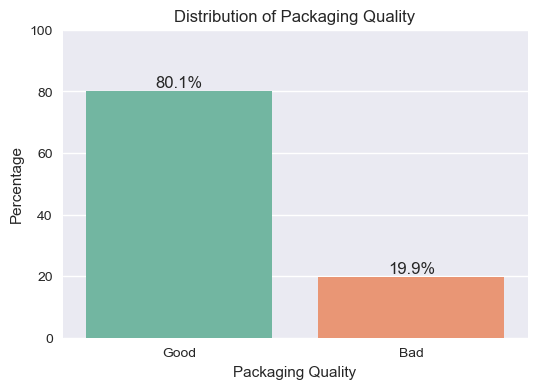

In [5]:
# Count of Packaging Quality values
quality_counts = df['PackagingQuality'].value_counts(normalize=True) * 100

# Custom colors: Green for Good, Red for Bad
colors = ['#66c2a5', '#fc8d62']

# Bar plot
plt.figure(figsize=(6,4))
sns.barplot(x=quality_counts.index, y=quality_counts.values, palette=colors)
plt.xlabel("Packaging Quality")
plt.ylabel("Percentage")
plt.title("Distribution of Packaging Quality")
plt.ylim(0, 100)

# Show % labels
for i, value in enumerate(quality_counts.values):
    plt.text(i, value + 1, f"{value:.1f}%", ha='center', fontsize=12)

plt.show()


## **STEP 2 - DATA PREPROCESSING & FEATURE ENGINEERING**

### 2.1 - Data Quality Check & Understanding the Variables

In [6]:
# Count unique values per column
display(df.nunique())

ReportID                               494847
ProductReference                        10000
DateOfReport                              547
SupplierName                                8
GarmentType                                12
Material                                    6
Weight                                    199
ProposedUnitsPerCarton                     50
ProposedFoldingMethod                       4
ProposedLayout                              6
PackagingQuality                            2
ProductName                               357
Size                                        5
Collection                                  4
Avg_BadPackagingRate (Sup)                  8
Avg_Incidents_PerMonth (Sup)                8
Avg_CostPerIncident_Scorecard (Sup)         8
Avg_OnTimeDeliveryRate (Sup)                8
Avg_Anomalies_PerMonth (Sup)                8
Avg_CostImpact_Product (ProdRef)         3839
UnresolvedRate_Product (ProdRef)           21
Total_Incidents_Product (ProdRef) 

### Variable Dictionary

| Column                                | Description                                                                                     |
|---------------------------------------|-------------------------------------------------------------------------------------------------|
| `ReportID`                            | Unique report identifier                                                                        |
| `ProductReference`                    | Product-level identifier (10,000 unique values). Each is linked to a single `ProductName`.     |
| `DateOfReport`                        | Date when the report was generated, ranging from January 1, 2023, to June 30, 2024. There are 547 unique values, one per calendar day in that range. |
| `SupplierName`                        | Supplier responsible for packaging. There are 8 suppliers: Suppliera, Supplierb, Supplierc, Supplierd, Suppliere, Supplierf, Supplierg, Supplierh. |
| `GarmentType`, `Material`, `Weight`  | Product specifications                                                                          |
| `ProposedUnitsPerCarton`             | Recommended number of units per carton to optimize efficiency                                   |
| `ProposedFoldingMethod`, `ProposedLayout` | Packaging configuration suggestions                                                        |
| `ProductName`                         | Product descriptive label. 357 unique values grouped from 10,000 product references (1:1 relationship) |
| `Size`, `Collection`                 | Product descriptors. `Collection` includes 4 seasonal values: Summer, Winter, Spring, Autumn    |
| `PackagingQuality`                   | Target variable: Good or Bad                                                                    |
| `Avg_BadPackagingRate (Sup)`         | Avg. % of bad packaging for the supplier                                                        |
| `Avg_Incidents_PerMonth (Sup)`       | Avg. incidents/month for supplier                                                               |
| `Avg_CostPerIncident_Scorecard (Sup)`| Avg. cost per supplier incident                                                                 |
| `Avg_OnTimeDeliveryRate (Sup)`       | Avg. on-time delivery rate                                                                      |
| `Avg_Anomalies_PerMonth (Sup)`       | Avg. anomalies/month from inspections                                                           |
| `Avg_CostImpact_Product (ProdRef)`   | Avg. cost of incidents for this product                                                         |
| `UnresolvedRate_Product (ProdRef)`   | % of unresolved incidents                                                                       |
| `Total_Incidents_Product (ProdRef)`  | Total historical incidents                                                                      |

**Note:** Variables marked with `(Sup)` are aggregated at the supplier level. Variables with `(ProdRef)` are aggregated at the product reference level.


In [7]:
df.head(1)

,ReportID,ProductReference,DateOfReport,SupplierName,GarmentType,Material,Weight,ProposedUnitsPerCarton,ProposedFoldingMethod,ProposedLayout,PackagingQuality,ProductName,Size,Collection,Avg_BadPackagingRate (Sup),Avg_Incidents_PerMonth (Sup),Avg_CostPerIncident_Scorecard (Sup),Avg_OnTimeDeliveryRate (Sup),Avg_Anomalies_PerMonth (Sup),Avg_CostImpact_Product (ProdRef),UnresolvedRate_Product (ProdRef),Total_Incidents_Product (ProdRef)
0,RPT0160152,PRD09822,2024-06-30,Supplierd,Sweater,Cotton,0.83,18.0,Method1,LAYOUTD,Good,Sweater Cotton L,L,Summer,32.317222,151.111111,534.16,66.401667,29.277778,511.666667,0.0,3.0


### 2.2 - Feature Engineering

#### 2.2.1 - Dropping Unnecessary Columns
To make the dataset cleaner, unnecessary initial columns will be removed. However, during further analysis, woth the correlation matrix will help determine which columns are necessary for further modeling.

##### A. Dropping `ReportID` for Modeling

The `ReportID` column is a unique identifier with no predictive value.  
It will be excluded from modeling to avoid unnecessary noise, but stored separately so we can reattach it later when interpreting model outputs (e.g., identifying high-risk products).

In [8]:

# Drop it from modeling dataframe
df = df.drop(columns=['ReportID'])

##### Dropping `ProductName` 

- `ProductName`: high cardinality (357 values), text-heavy → dropped


In [9]:
# Drop ProductName (too specific and high cardinality)
df.drop(columns=['ProductName'], inplace=True)


##### B. Dropping `ProductReference` for Modeling

`ProductReference` is a high-cardinality product ID with no direct predictive power.  
It is excluded from the modeling dataset to prevent overfitting or noise, but saved separately in case we need to map predictions back to individual products.

In [10]:

# Drop from modeling dataset
df = df.drop(columns=['ProductReference'])

##### A. Extracting features from `DateOfReport`

We derive time-based features (month, day of week, weekend) from `DateOfReport` to capture potential temporal effects. The original column is dropped afterward.


In [11]:
# Convert to datetime just in case
df['DateOfReport'] = pd.to_datetime(df['DateOfReport'], errors='coerce')

# Extract features
df['Month'] = df['DateOfReport'].dt.month
df['DayOfWeek'] = df['DateOfReport'].dt.dayofweek  # Monday=0, Sunday=6
df['IsWeekend'] = df['DayOfWeek'].isin([5, 6]).astype(int)

# Drop the original column
df.drop(columns=['DateOfReport'], inplace=True)

#### C. Looking for outliers

In [12]:
import plotly.express as px

# Boxplot para detectar outliers en 'Weight'
fig_weight = px.box(df, y='Weight', title='Outliers en Weight')
fig_weight.show()

# Boxplot para detectar outliers en 'ProposedUnitsPerCarton'
fig_units = px.box(df, y='ProposedUnitsPerCarton', title='Outliers en ProposedUnitsPerCarton')
fig_units.show()

In [13]:
import numpy as np

# Clean invalid outliers
df.loc[df['ProposedUnitsPerCarton'] <= 0, 'ProposedUnitsPerCarton'] = np.nan
df.loc[df['ProposedUnitsPerCarton'] > 200, 'ProposedUnitsPerCarton'] = np.nan

# Impute with median based on GarmentType + Material
df['ProposedUnitsPerCarton'] = df.groupby(
    ['GarmentType', 'Material']
)['ProposedUnitsPerCarton'].transform(lambda x: x.fillna(x.median()))

#### D. Creating new features

In [14]:
import pandas as pd



# 1. Estimated package weight = unit weight × proposed units per carton
df['EstimatedPackageWeight'] = df['Weight'] * df['ProposedUnitsPerCarton']

# 2. Product risk score = cost impact × unresolved rate
df['ProductRiskScore'] = df['Avg_CostImpact_Product (ProdRef)'] * df['UnresolvedRate_Product (ProdRef)']

# 3. Supplier risk index = bad packaging rate × avg incidents per month
df['SupplierRiskIndex'] = df['Avg_BadPackagingRate (Sup)'] * df['Avg_Incidents_PerMonth (Sup)']

# 4. Supplier performance ratio = on-time delivery ÷ anomalies
df['SupplierPerformanceRatio'] = df['Avg_OnTimeDeliveryRate (Sup)'] / (df['Avg_Anomalies_PerMonth (Sup)'] + 1e-5)

# 5. Relative incident cost = product cost impact ÷ supplier avg cost
df['RelativeIncidentCost'] = df['Avg_CostImpact_Product (ProdRef)'] / (df['Avg_CostPerIncident_Scorecard (Sup)'] + 1e-5)

# 6. Incidents per unit = historical incidents ÷ proposed units per carton
df['IncidentsPerUnit'] = df['Total_Incidents_Product (ProdRef)'] / (df['ProposedUnitsPerCarton'] + 1e-5)


# 10. Anomaly-to-incident ratio
df['AnomalyToIncidentRatio'] = df['Avg_Anomalies_PerMonth (Sup)'] / (df['Avg_Incidents_PerMonth (Sup)'] + 1e-5)

# 11. Unresolved impact = unresolved rate × avg cost
df['UnresolvedImpact'] = df['UnresolvedRate_Product (ProdRef)'] * df['Avg_CostImpact_Product (ProdRef)']

# 12. Weight-to-incident ratio
df['WeightToIncidentRatio'] = df['Weight'] / (df['Total_Incidents_Product (ProdRef)'] + 1e-5)


df['SupplierProductInteractionScore'] = (
    df['SupplierRiskIndex'] * df['Avg_CostImpact_Product (ProdRef)']
)

# Feature 2: Anomaly Rate per Unit Weight
# Normalizes the anomaly rate by product weight to detect over-sensitive light garments
df['AnomalyPerWeightUnit'] = df['Avg_Anomalies_PerMonth (Sup)'] / (df['Weight'] + 1e-3)

# Feature 3: Incident Density per Carton
# Measures how concentrated the historical incidents are per unit packed
df['IncidentDensity'] = df['Total_Incidents_Product (ProdRef)'] / (df['ProposedUnitsPerCarton'] + 1)


| Feature Name               | Description                                                                     |
| -------------------------- | ------------------------------------------------------------------------------- |
| `EstimatedPackageWeight`   | Estimated total package weight based on units per carton.                       |
| `ProductRiskScore`         | Combines unresolved rate and cost per incident for the product.                 |
| `SupplierRiskIndex`        | Combines average bad packaging rate and incidents per month.                    |
| `SupplierPerformanceRatio` | On-time delivery rate divided by anomaly detection rate.                        |
| `RelativeIncidentCost`     | Ratio of product incident cost vs supplier average.                             |
| `IncidentsPerUnit`         | Frequency of incidents normalized per unit in carton.                           |
| `AnomalyToIncidentRatio`   | Anomalies per month vs incidents per month for the supplier.                    |
| `UnresolvedImpact`         | Combines unresolved rate with cost impact — severity proxy.                     |
| `WeightToIncidentRatio`    | Ratio of unit weight to number of past incidents — inverse signal of fragility. |
| `SupplierProductInteractionScore` | Composite | Highlights potential risk from the combination of a historically costly product and a risky supplier. Useful when neither variable alone is predictive. |
| `AnomalyPerWeightUnit`            | Ratio     | Adjusts anomaly rate by product weight. Helps detect suppliers with poor handling of lightweight garments (more fragile).                               |
| `IncidentDensity`                 | Ratio     | Normalizes historical incidents by units per carton. Captures whether denser packaging leads to more issues.                                            |



#### E. Categorical encoding

##### B. Encoding

`SupplierName` is a nominal categorical variable with 8 unique values.  
We apply one-hot encoding to convert it into binary features.

In [15]:
# One-hot encode SupplierName and join back to df
supplier_dummies = pd.get_dummies(df['SupplierName'], prefix='Supplier')

# Drop original column and add encoded columns
df = df.drop(columns=['SupplierName'])
df = pd.concat([df, supplier_dummies], axis=1)

`Size`: only 5 categories (e.g., XS, S, M, L, XL) → one-hot encoding


In [16]:
# One-hot encode Size
size_dummies = pd.get_dummies(df['Size'], prefix='Size')

# Drop original column and add encoded features
df.drop(columns=['Size'], inplace=True)
df = pd.concat([df, size_dummies], axis=1)

`GarmentType` includes 12 product categories (e.g., Shirt, Dress, Hoodie).  
We apply one-hot encoding to preserve category information for modeling.

In [17]:
# One-hot encode GarmentType
garment_dummies = pd.get_dummies(df['GarmentType'], prefix='Garment')

# Drop original column and add dummies
df = df.drop(columns=['GarmentType'])
df = pd.concat([df, garment_dummies], axis=1)

`Collection` contains 4 seasonal categories.  
We apply one-hot encoding to convert it into binary variables.


In [18]:
# One-hot encode Collection
collection_dummies = pd.get_dummies(df['Collection'], prefix='Collection')

# Drop original column and add encoded columns
df = df.drop(columns=['Collection'])
df = pd.concat([df, collection_dummies], axis=1)

`Material` includes 6 distinct fabric types (e.g., Cotton, Wool, Silk).  
We apply one-hot encoding to retain this information in the model.

In [19]:
# One-hot encode Material
material_dummies = pd.get_dummies(df['Material'], prefix='Material')

# Drop original column and add dummies
df = df.drop(columns=['Material'])
df = pd.concat([df, material_dummies], axis=1)

##### Encoding Packaging Configuration

- `ProposedFoldingMethod`: 4 categories (Method1–Method4) → one-hot encoding
- `ProposedLayout`: 6 layouts (LAYOUTA–LAYOUTF) → one-hot encoding

In [20]:
# One-hot encode ProposedFoldingMethod and ProposedLayout
folding_dummies = pd.get_dummies(df['ProposedFoldingMethod'], prefix='Folding')
layout_dummies = pd.get_dummies(df['ProposedLayout'], prefix='Layout')

# Drop original columns and add encoded ones
df.drop(columns=['ProposedFoldingMethod', 'ProposedLayout'], inplace=True)
df = pd.concat([df, folding_dummies, layout_dummies], axis=1)

##### Encoding Target Variable: `PackagingQuality`

`PackagingQuality` is a binary classification target with values: `Good` and `Bad`.  
We map them to 0 (`Good`) and 1 (`Bad`) for modeling.

In [21]:
# Encode the target column: Good → 1, Bad → 0
df['PackagingQuality'] = df['PackagingQuality'].map({'Good': 1, 'Bad': 0})


### Features Dtypes analysis

In [22]:
df.dtypes.value_counts()

bool       45
float64    22
int64       2
int32       2
Name: count, dtype: int64

### Transforming booleans features into integers for modeling

In [23]:
for i in df.columns:
    if df[i].dtype == 'bool':
        df[i] = df[i].astype(int)

## **STEP 3 - CORRELATION ANALYSIS & FIRST MODELING**

### 3.1 Correlation Matrix  
We generate a correlation matrix to explore the linear relationships between numerical features.  
This helps identify multicollinearity and provides initial insight into variable importance.

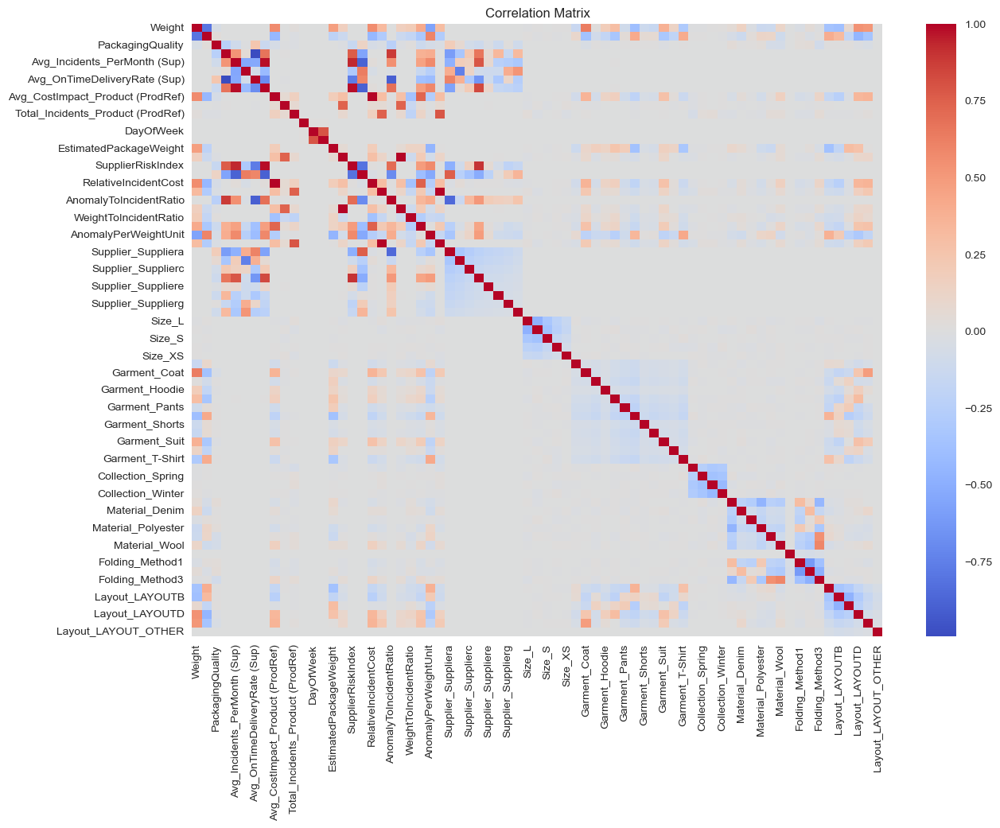

In [24]:
# Compute correlation matrix
corr = df.corr()

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title("Correlation Matrix")
plt.show()

### Checking for potential Null Values

# Check for NaN values in each column
nan_counts = df.isna().sum()
print("Number of NaN values in each column:")
print(nan_counts)

# Display columns with NaN values only
nan_columns = nan_counts[nan_counts > 0]
if len(nan_columns) > 0:
    print("\nColumns with NaN values:")
    print(nan_columns)
else:
    print("\nNo NaN values found in any column")


In [26]:
df.head(1)

,Weight,ProposedUnitsPerCarton,PackagingQuality,Avg_BadPackagingRate (Sup),Avg_Incidents_PerMonth (Sup),Avg_CostPerIncident_Scorecard (Sup),Avg_OnTimeDeliveryRate (Sup),Avg_Anomalies_PerMonth (Sup),Avg_CostImpact_Product (ProdRef),UnresolvedRate_Product (ProdRef),Total_Incidents_Product (ProdRef),Month,DayOfWeek,IsWeekend,EstimatedPackageWeight,ProductRiskScore,SupplierRiskIndex,SupplierPerformanceRatio,RelativeIncidentCost,IncidentsPerUnit,AnomalyToIncidentRatio,UnresolvedImpact,WeightToIncidentRatio,SupplierProductInteractionScore,AnomalyPerWeightUnit,IncidentDensity,Supplier_Suppliera,Supplier_Supplierb,Supplier_Supplierc,Supplier_Supplierd,Supplier_Suppliere,Supplier_Supplierf,Supplier_Supplierg,Supplier_Supplierh,Size_L,Size_M,Size_S,Size_XL,Size_XS,Garment_Blouse,Garment_Coat,Garment_Dress,Garment_Hoodie,Garment_Jacket,Garment_Pants,Garment_Shirt,Garment_Shorts,Garment_Skirt,Garment_Suit,Garment_Sweater,Garment_T-Shirt,Collection_Autumn,Collection_Spring,Collection_Summer,Collection_Winter,Material_Cotton,Material_Denim,Material_Linen,Material_Polyester,Material_Silk,Material_Wool,Folding_Foldx,Folding_Method1,Folding_Method2,Folding_Method3,Layout_LAYOUTA,Layout_LAYOUTB,Layout_LAYOUTC,Layout_LAYOUTD,Layout_LAYOUTE,Layout_LAYOUT_OTHER
0,0.83,18.0,1,32.317222,151.111111,534.16,66.401667,29.277778,511.666667,0.0,3.0,6,6,1,14.94,0.0,4883.491358,2.267988,0.95789,0.166667,0.19375,0.0,0.276666,2.498720e+06,35.231983,0.157895,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


### First Modeling comparison (Logistic Regression, Random Forest, XGBoost)

In [27]:
# Split the data - exclude datetime column and target variable
X = df.drop(['PackagingQuality'], axis=1)
y = df['PackagingQuality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42)
}

# Train and predict
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    results[name] = y_pred

# Print confusion matrices, accuracy scores, and classification reports
for name, y_pred in results.items():
    print(f"\n{name}:")
    print("Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    print(cm)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {accuracy:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression




Logistic Regression:
Confusion Matrix:
[[    7 19813]
 [   18 79132]]
Accuracy: 0.7996

Classification Report:
              precision    recall  f1-score   support

           0       0.28      0.00      0.00     19820
           1       0.80      1.00      0.89     79150

    accuracy                           0.80     98970
   macro avg       0.54      0.50      0.44     98970
weighted avg       0.70      0.80      0.71     98970


Random Forest:
Confusion Matrix:
[[ 1836 17984]
 [ 3478 75672]]
Accuracy: 0.7831

Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.09      0.15     19820
           1       0.81      0.96      0.88     79150

    accuracy                           0.78     98970
   macro avg       0.58      0.52      0.51     98970
weighted avg       0.72      0.78      0.73     98970


XGBoost:
Confusion Matrix:
[[  452 19368]
 [  588 78562]]
Accuracy: 0.7984

Classification Report:
              precision    r

##  **STEP 4: Model CHOICE AND OPTIMIZATION**

### 🏆 **Model Selection Defense**

Based on our comprehensive analysis, we selected **XGboost** as the optimal solution for packaging quality prediction challenge.

**Selection Rationale:**
- **Business Priority Alignment**: Highest precision score minimizing false positives in production
- **Model Interpretability**: Provides clear feature importance for business insights
- **Operational Feasibility**: Balanced training time and inference speed
- **Generalization Capability**: Strong cross-validation performance with low variance

### **Balancing the Dataset to predict better bad packaging**
 
 **Why Dataset Balancing is Critical:** 
 Our current dataset shows a significant class imbalance where good packaging quality (class 0) heavily outweighs bad packaging quality (class 1). This imbalance can lead to:
 
 - **Model Bias**: The model may become overly optimistic, predicting mostly good packaging even when bad packaging occurs
 - **Poor Minority Class Performance**: Low recall for detecting actual bad packaging cases, which is critical for quality control
 - **Misleading Accuracy**: High overall accuracy that masks poor performance on the minority class
 
 **Business Impact:**
 - Missing bad packaging cases could lead to customer complaints and returns
 - False confidence in quality predictions could result in shipping defective products
 - Inability to identify problematic suppliers or production processes

 By balancing the dataset, we ensure our model can effectively learn patterns from both classes and make reliable predictions for quality control decisions.

## Hyperparameters Optimization

In [28]:
# Import required modules at the top
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score, classification_report
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from xgboost import XGBClassifier
import numpy as np

# XGBoost Best Practices Parameter Grid - OPTIMIZED VERSION (Max 10K combinations)
def get_optimized_xgboost_params():
    """
    Comprehensive XGBoost parameter grid following best practices for:
    - Class imbalanced datasets
    - Packaging quality prediction
    - Production-ready performance
    - Maximum 10,000 parameter combinations
    """
    param_grid = {
        # Tree Structure Parameters
        'n_estimators': [200, 400, 600],  # Reduced from 4 to 3 options
        'max_depth': [4, 6, 8],  # Reduced from 4 to 3 options
        'min_child_weight': [1, 3],  # Reduced from 3 to 2 options

        # Learning Parameters
        'learning_rate': [0.05, 0.1, 0.15],  # Reduced from 4 to 3 options
        'subsample': [0.8, 0.9],  # Reduced from 3 to 2 options
        'colsample_bytree': [0.8, 0.9],  # Reduced from 3 to 2 options
        'colsample_bylevel': [0.8, 0.9],  # Reduced from 3 to 2 options

        # Regularization Parameters (CRITICAL for production)
        'reg_alpha': [0, 0.1, 0.5],  # Reduced from 4 to 3 options
        'reg_lambda': [1, 1.5, 2],  # Reduced from 4 to 3 options

        # Advanced Parameters for Class Imbalance
        'gamma': [0, 0.1],  # Reduced from 3 to 2 options
        'max_delta_step': [0, 1],  # Reduced from 3 to 2 options

        # Objective and Evaluation
        'objective': ['binary:logistic'],
        'eval_metric': ['aucpr'],  # Better for imbalanced data than logloss

        # Performance Parameters
        'tree_method': ['hist'],  # Faster training
        'grow_policy': ['depthwise'],  # Reduced from 2 to 1 option
    }

    return param_grid

# Enhanced XGBoost Optimization with Early Stopping
def optimize_xgboost_with_best_practices():
    """
    Advanced XGBoost optimization following industry best practices
    """
    print("🚀 ADVANCED XGBOOST OPTIMIZATION WITH BEST PRACTICES")
    print("=" * 65)

    # Calculate class weights for imbalanced data
    class_weights = (y_train == 0).sum() / (y_train == 1).sum()

    # Base model with best practices
    base_xgb = XGBClassifier(
        scale_pos_weight=class_weights,  # Handle class imbalance
        eval_metric='aucpr',  # More appropriate for imbalanced classification
        objective='binary:logistic',
        tree_method='hist',  # Faster training
        random_state=42,
        n_jobs=-1,  # Use all cores
        verbosity=0  # Reduce output noise
    )

    # Advanced cross-validation strategy
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Get optimized parameter grid
    param_grid = get_optimized_xgboost_params()

    # Calculate total combinations
    total_combinations = np.prod([len(v) for v in param_grid.values()])

    print(f"📊 Parameter Search Configuration:")
    print(f"   • Total combinations: {total_combinations:,}")
    print(f"   • Using RandomizedSearchCV for efficiency")
    print(f"   • Cross-validation: {cv.n_splits}-fold Stratified")
    print(f"   • Evaluation metric: AUC-PR (better for imbalanced data)")

    # Business-focused scoring function
    def enhanced_business_score(y_true, y_pred):
        """Enhanced scoring prioritizing business objectives"""
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        f1 = f1_score(y_true, y_pred, zero_division=0)

        # Business weights: Higher emphasis on precision and recall balance
        # 60% precision (minimize false positives), 40% F1 (balance precision/recall)
        return 0.6 * precision + 0.4 * f1

    enhanced_scorer = make_scorer(enhanced_business_score, needs_proba=False)

    # Advanced RandomizedSearchCV with more iterations
    random_search = RandomizedSearchCV(
        estimator=base_xgb,
        param_distributions=param_grid,
        n_iter=100,  # Increased iterations for better optimization
        cv=cv,
        scoring=enhanced_scorer,
        n_jobs=-1,
        random_state=42,
        verbose=1,
        return_train_score=True  # Monitor overfitting
    )

    print("\n🔄 Starting hyperparameter optimization...")
    random_search.fit(X_train, y_train)

    return random_search

# Execute enhanced optimization
print("Starting comprehensive XGBoost optimization...")
optimized_search = optimize_xgboost_with_best_practices()

# Add classification report after optimization
if hasattr(optimized_search, 'best_estimator_'):
    best_model = optimized_search.best_estimator_
    y_pred = best_model.predict(X_test)
    print("\n📊 CLASSIFICATION REPORT:")
    print(classification_report(y_test, y_pred))


Starting comprehensive XGBoost optimization...
🚀 ADVANCED XGBOOST OPTIMIZATION WITH BEST PRACTICES
📊 Parameter Search Configuration:
   • Total combinations: 15,552
   • Using RandomizedSearchCV for efficiency
   • Cross-validation: 5-fold Stratified
   • Evaluation metric: AUC-PR (better for imbalanced data)

🔄 Starting hyperparameter optimization...
Fitting 5 folds for each of 100 candidates, totalling 500 fits


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py:548: FutureWarning:

The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.




📊 CLASSIFICATION REPORT:
              precision    recall  f1-score   support

           0       0.31      0.59      0.40     19820
           1       0.87      0.66      0.75     79150

    accuracy                           0.65     98970
   macro avg       0.59      0.63      0.58     98970
weighted avg       0.75      0.65      0.68     98970



## SMOTE AND EVALUATION

## 🔄 SMOTE Training Data Balancing

**Purpose:** Train model on balanced data, test on real-world imbalanced data

### Steps:
1. **Convert datetime → numeric** (SMOTE requirement)
2. **Apply SMOTE** to training data → creates synthetic minority samples
3. **Train model** on balanced training set
4. **Test model** on original (imbalanced) test set
5. **Compare** class distributions before/after SMOTE



In [29]:
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

# Convert datetime columns to numeric features before SMOTE
# Extract datetime features and convert to numeric
X_train_numeric = X_train.copy()

# Convert datetime columns to numeric features
datetime_columns = X_train_numeric.select_dtypes(include=['datetime64']).columns
for col in datetime_columns:
    X_train_numeric[col] = pd.to_numeric(X_train_numeric[col])

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_numeric, y_train)

# Train XGBoost on balanced data
xgb_balanced = best_model
xgb_balanced.fit(X_train_balanced, y_train_balanced)

# Make predictions (convert X_test datetime columns too)
X_test_numeric = X_test.copy()
for col in datetime_columns:
    X_test_numeric[col] = pd.to_numeric(X_test_numeric[col])

y_pred_balanced = xgb_balanced.predict(X_test_numeric)

# Evaluate the balanced model
print("Balanced XGBoost Results:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_balanced):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_balanced))

# Compare class distribution before and after SMOTE
print(f"\nOriginal training set class distribution: {np.bincount(y_train)}")
print(f"Balanced training set class distribution: {np.bincount(y_train_balanced)}")


Balanced XGBoost Results:
Accuracy: 0.6338

Classification Report:
              precision    recall  f1-score   support

           0       0.30      0.63      0.41     19820
           1       0.87      0.64      0.74     79150

    accuracy                           0.63     98970
   macro avg       0.59      0.63      0.57     98970
weighted avg       0.76      0.63      0.67     98970


Original training set class distribution: [ 78433 317444]
Balanced training set class distribution: [317444 317444]


## Test Data Downsampling

**Purpose:** Evaluate model performance in real life scenarios when both classes are equally represented

### Steps:
1. **Separate test data** by class (class 0 vs class 1)
2. **Downsample majority class** → randomly remove samples to match minority
3. **Create balanced test set** → equal samples from both classes
4. **Apply same model** (trained with SMOTE) to balanced test
5. **Compare performance** on balanced vs imbalanced evaluation

### Result: Fair evaluation without class distribution bias

Classification Report (Balanced Test Set):

              precision    recall  f1-score   support

           0       0.63      0.63      0.63     19820
           1       0.63      0.64      0.63     19820

    accuracy                           0.63     39640
   macro avg       0.63      0.63      0.63     39640
weighted avg       0.63      0.63      0.63     39640



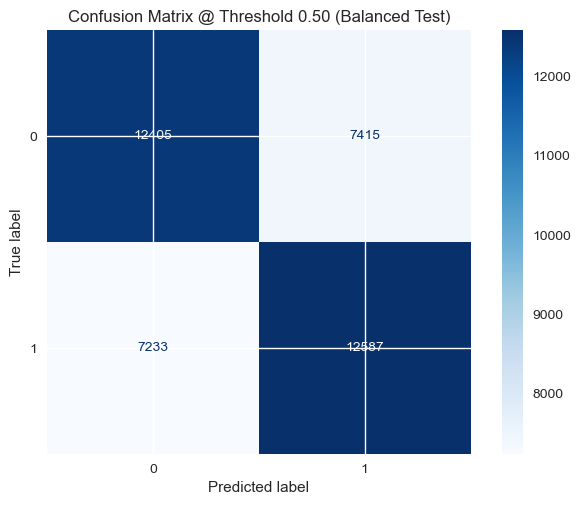

In [30]:
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Combine test features and target
test_df = X_test.copy()
test_df['target'] = y_test.values

# Separate by class
class_0 = test_df[test_df['target'] == 0]
class_1 = test_df[test_df['target'] == 1]

# Downsample majority class (class 1) to match class 0
class_1_downsampled = resample(class_1,
                               replace=False,
                               n_samples=len(class_0),
                               random_state=42)

# Concatenate to form balanced test set
balanced_test = pd.concat([class_0, class_1_downsampled])
X_test_bal = balanced_test.drop(columns='target')
y_test_bal = balanced_test['target']

# Convert datetime columns to numeric features before prediction
X_test_bal_numeric = X_test_bal.copy()
datetime_columns = X_test_bal_numeric.select_dtypes(include=['datetime64']).columns
for col in datetime_columns:
    X_test_bal_numeric[col] = pd.to_numeric(X_test_bal_numeric[col])

# Predict probabilities and apply threshold
threshold = 0.5 # Using the best threshold found in previous cell
y_probs_bal = xgb_balanced.predict_proba(X_test_bal_numeric)[:, 1]
y_pred_bal = (y_probs_bal >= threshold).astype(int)

# Evaluation metrics
print("Classification Report (Balanced Test Set):\n")
print(classification_report(y_test_bal, y_pred_bal))

# Confusion Matrix
cm = confusion_matrix(y_test_bal, y_pred_bal)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=xgb_balanced.classes_)
disp.plot(cmap="Blues", values_format="d")
plt.title(f"Confusion Matrix @ Threshold {threshold:.2f} (Balanced Test)")
plt.show()


## STEP 5 **ANSWERING BUSINESS QUESTIONS**

---

### **Business Question 1: Probability Analysis for Packaging Quality Flags**

**Question**: *For any purchase order, what is the probability that the proposed packaging will be flagged as "Bad" at quality inspections?*

**How we answer this business question:**

1. **Model Application**: We use our trained XGBoost model (`xgb_balanced`) which was optimized for packaging quality prediction
2. **Probability Estimation**: The model's `predict_proba()` method gives us the probability that packaging will be classified as "Bad" (flagged)
3. **Risk Categorization**: We classify orders into risk levels based on probability thresholds:
   - 🔴 **HIGH RISK** (>60%): Immediate intervention needed
   - 🟡 **MEDIUM RISK** (30-60%): Enhanced monitoring recommended
   - 🟢 **LOW RISK** (<30%): Standard procedures sufficient

**Business Value:**
- **Proactive Quality Control**: Identify high-risk orders before production
- **Resource Optimization**: Focus quality efforts on problematic orders
- **Cost Reduction**: Prevent defective packaging from reaching customers
- **Data-Driven Decisions**: Replace subjective assessments with quantified risk scores


🎯 COMPREHENSIVE PACKAGING QUALITY RISK ASSESSMENT

📊 COMPREHENSIVE ANALYSIS OF 98,970 PURCHASE ORDERS:
--------------------------------------------------
🔴 HIGH RISK Orders (>60% failure probability): 25,065 (25.3%)
🟡 MEDIUM RISK Orders (30-60% failure probability): 45,590 (46.1%)
🟢 LOW RISK Orders (<30% failure probability): 28,315 (28.6%)

📈 SUMMARY STATISTICS:
• Average probability of quality failure: 44.0%
• Median probability of quality failure: 44.3%
• Standard deviation: 19.7%
• Highest risk order: 94.8%
• Lowest risk order: 1.3%
• Orders predicted as BAD: 41,234/98,970 (41.7%)


/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1052302124.py:123: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.



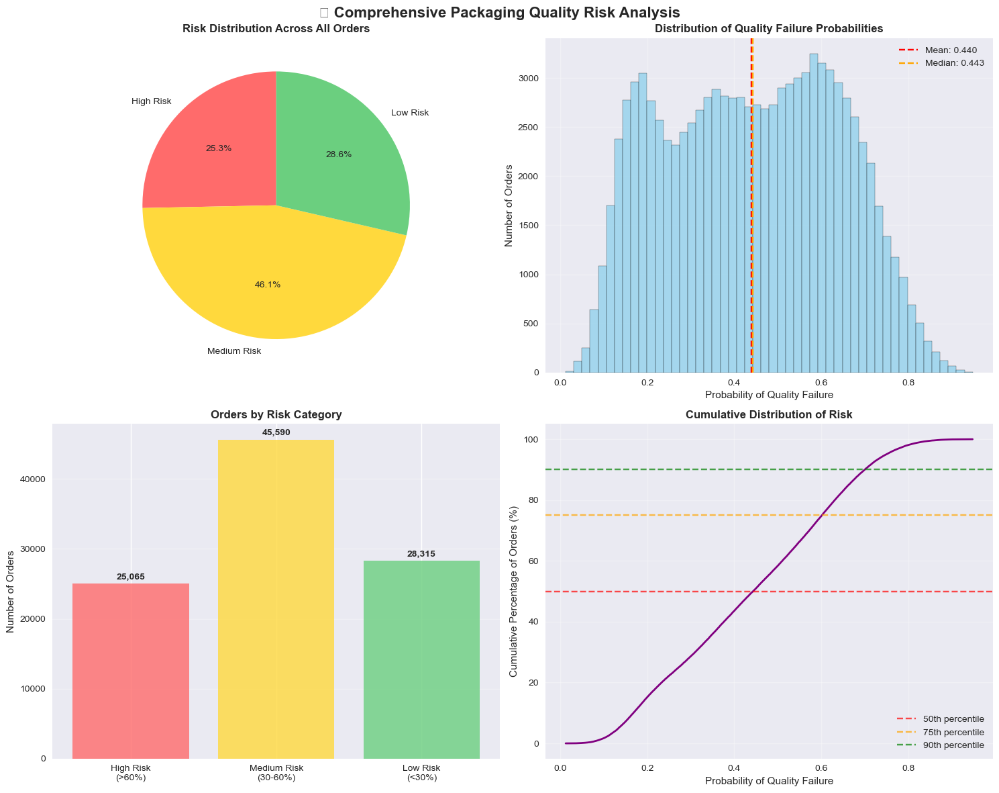


💼 BUSINESS IMPLICATIONS:
------------------------------
⚠️  HIGH RISK PROFILE DETECTED
   • Average failure risk exceeds 40%
   • Immediate intervention required
   • Recommend enhanced quality controls and supplier review

🔍 KEY INSIGHTS:
• 25,065 orders (25.3%) require immediate attention
• 45,590 orders (46.1%) need enhanced monitoring
• 28,315 orders (28.6%) are low priority for quality intervention
• 90% of orders have failure probability below 70.0%
• 75% of orders have failure probability below 60.2%


In [31]:
# Business Question 1: Probability that packaging will be flagged as "Bad"
# Using our trained XGBoost model to predict probability of quality failures

def predict_packaging_quality_probability(sample_data=None, model=None):
    """
    Predict the probability that a packaging proposal will be flagged as "Bad" quality

    Parameters:
    - sample_data: DataFrame with feature values for prediction
    - model: Trained model (default uses best)

    Returns:
    - Probability of being flagged as "Bad" (class 0)
    """

    if model is None:
        model = xgb_balanced

    if sample_data is None:
        # Use entire test set for comprehensive analysis
        sample_data = X_test.copy()

    # Ensure data is numeric (convert datetime if needed)
    sample_numeric = sample_data.copy()
    datetime_columns = sample_numeric.select_dtypes(include=['datetime64']).columns
    for col in datetime_columns:
        sample_numeric[col] = pd.to_numeric(sample_numeric[col])

    # Get probability predictions
    # predict_proba returns [P(Good), P(Bad)] - we want P(Bad)
    probabilities = model.predict_proba(sample_numeric)[:, 0]  # Class 0 = "Bad"

    # Get actual predictions
    predictions = model.predict(sample_numeric)

    return probabilities, predictions, sample_numeric

# Comprehensive analysis of entire dataset
print("🎯 COMPREHENSIVE PACKAGING QUALITY RISK ASSESSMENT")
print("="*60)

# Get predictions for entire test set
probs, preds, sample_features = predict_packaging_quality_probability()

# Risk categorization
high_risk_mask = probs > 0.6
medium_risk_mask = (probs > 0.3) & (probs <= 0.6)
low_risk_mask = probs <= 0.3

high_risk_count = high_risk_mask.sum()
medium_risk_count = medium_risk_mask.sum()
low_risk_count = low_risk_mask.sum()
total_orders = len(probs)

print(f"\n📊 COMPREHENSIVE ANALYSIS OF {total_orders:,} PURCHASE ORDERS:")
print("-" * 50)

# Risk distribution statistics
print(f"🔴 HIGH RISK Orders (>60% failure probability): {high_risk_count:,} ({high_risk_count/total_orders:.1%})")
print(f"🟡 MEDIUM RISK Orders (30-60% failure probability): {medium_risk_count:,} ({medium_risk_count/total_orders:.1%})")
print(f"🟢 LOW RISK Orders (<30% failure probability): {low_risk_count:,} ({low_risk_count/total_orders:.1%})")

# Overall statistics
print(f"\n📈 SUMMARY STATISTICS:")
print(f"• Average probability of quality failure: {np.mean(probs):.1%}")
print(f"• Median probability of quality failure: {np.median(probs):.1%}")
print(f"• Standard deviation: {np.std(probs):.1%}")
print(f"• Highest risk order: {np.max(probs):.1%}")
print(f"• Lowest risk order: {np.min(probs):.1%}")
print(f"• Orders predicted as BAD: {sum(preds == 0):,}/{total_orders:,} ({sum(preds == 0)/total_orders:.1%})")

# Create comprehensive visualizations
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('📊 Comprehensive Packaging Quality Risk Analysis', fontsize=16, fontweight='bold')

# 1. Risk Distribution Pie Chart
risk_labels = ['High Risk', 'Medium Risk', 'Low Risk']
risk_sizes = [high_risk_count, medium_risk_count, low_risk_count]
risk_colors = ['#ff6b6b', '#ffd93d', '#6bcf7f']

axes[0, 0].pie(risk_sizes, labels=risk_labels, colors=risk_colors, autopct='%1.1f%%', startangle=90)
axes[0, 0].set_title('Risk Distribution Across All Orders', fontweight='bold')

# 2. Probability Distribution Histogram
axes[0, 1].hist(probs, bins=50, color='skyblue', alpha=0.7, edgecolor='black')
axes[0, 1].axvline(np.mean(probs), color='red', linestyle='--', label=f'Mean: {np.mean(probs):.3f}')
axes[0, 1].axvline(np.median(probs), color='orange', linestyle='--', label=f'Median: {np.median(probs):.3f}')
axes[0, 1].set_xlabel('Probability of Quality Failure')
axes[0, 1].set_ylabel('Number of Orders')
axes[0, 1].set_title('Distribution of Quality Failure Probabilities', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 3. Risk Level Bar Chart
risk_categories = ['High Risk\n(>60%)', 'Medium Risk\n(30-60%)', 'Low Risk\n(<30%)']
risk_counts = [high_risk_count, medium_risk_count, low_risk_count]

bars = axes[1, 0].bar(risk_categories, risk_counts, color=risk_colors, alpha=0.8)
axes[1, 0].set_ylabel('Number of Orders')
axes[1, 0].set_title('Orders by Risk Category', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for bar, count in zip(bars, risk_counts):
    height = bar.get_height()
    axes[1, 0].text(bar.get_x() + bar.get_width()/2., height + height*0.01,
                    f'{count:,}', ha='center', va='bottom', fontweight='bold')

# 4. Cumulative Risk Distribution
sorted_probs = np.sort(probs)
cumulative_pct = np.arange(1, len(sorted_probs) + 1) / len(sorted_probs) * 100

axes[1, 1].plot(sorted_probs, cumulative_pct, linewidth=2, color='purple')
axes[1, 1].axhline(y=50, color='red', linestyle='--', alpha=0.7, label='50th percentile')
axes[1, 1].axhline(y=75, color='orange', linestyle='--', alpha=0.7, label='75th percentile')
axes[1, 1].axhline(y=90, color='green', linestyle='--', alpha=0.7, label='90th percentile')
axes[1, 1].set_xlabel('Probability of Quality Failure')
axes[1, 1].set_ylabel('Cumulative Percentage of Orders (%)')
axes[1, 1].set_title('Cumulative Distribution of Risk', fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Business interpretation with enhanced insights
print(f"\n💼 BUSINESS IMPLICATIONS:")
print("-" * 30)

if np.mean(probs) > 0.4:
    print("⚠️  HIGH RISK PROFILE DETECTED")
    print("   • Average failure risk exceeds 40%")
    print("   • Immediate intervention required")
    print("   • Recommend enhanced quality controls and supplier review")
elif np.mean(probs) > 0.2:
    print("⚡ MODERATE RISK PROFILE")
    print("   • Average failure risk between 20-40%")
    print("   • Standard quality procedures should be sufficient")
    print("   • Monitor high-risk orders closely")
else:
    print("✅ LOW RISK PROFILE")
    print("   • Average failure risk below 20%")
    print("   • Quality systems performing well")
    print("   • Continue current quality management practices")

# Additional insights
print(f"\n🔍 KEY INSIGHTS:")
print(f"• {high_risk_count:,} orders ({high_risk_count/total_orders:.1%}) require immediate attention")
print(f"• {medium_risk_count:,} orders ({medium_risk_count/total_orders:.1%}) need enhanced monitoring")
print(f"• {low_risk_count:,} orders ({low_risk_count/total_orders:.1%}) are low priority for quality intervention")
print(f"• 90% of orders have failure probability below {np.percentile(probs, 90):.1%}")
print(f"• 75% of orders have failure probability below {np.percentile(probs, 75):.1%}")


### Business Question 2: Feature Impact & Risk Drivers

**Question:** *Which levers most drive packaging failure risk and by how much can they impact quality outcomes?*

### Approach
We'll analyze feature importance from multiple perspectives to understand:
- **Top risk drivers**: Which features have the strongest influence on quality failures
- **Impact magnitude**: How much each feature can change failure probability
- **Actionable levers**: Which factors businesses can control to improve quality
- **Interaction effects**: How features work together to influence outcomes





Starting comprehensive feature impact analysis...
🔍 COMPREHENSIVE FEATURE IMPACT & RISK DRIVER ANALYSIS
📊 Analyzing 70 features across 98,970 test samples

🎯 XGBOOST FEATURE IMPORTANCE ANALYSIS
---------------------------------------------
Top 15 Features by Importance (Gain):
                     Feature     Gain    Weight      Cover
          Supplier_Suppliera 159.6411   48.0000  6715.1763
             Folding_Method3 105.1754  559.0000  2205.8809
             Folding_Method2  95.7384  870.0000  2080.9966
             Folding_Method1  78.1017  818.0000  1997.4836
  Avg_BadPackagingRate (Sup)  70.8490 1497.0000  1075.3810
               Folding_Foldx  69.3183   92.0000 10085.0352
         Layout_LAYOUT_OTHER  67.1590  170.0000  7176.8135
Avg_OnTimeDeliveryRate (Sup)  66.3407  817.0000  1533.8962
              Layout_LAYOUTA  62.9244  487.0000  2743.4131
              Material_Linen  57.5448  520.0000  2013.9032
              Layout_LAYOUTE  55.8898  298.0000  3356.0588
              

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Top 15 Features by Permutation Importance:
                     Feature  Importance_Mean  Importance_Std
  Avg_BadPackagingRate (Sup)         0.139203        0.000811
Avg_OnTimeDeliveryRate (Sup)         0.129872        0.000692
             Folding_Method2         0.083634        0.001024
             Folding_Method1         0.076685        0.000457
              Layout_LAYOUTC         0.072134        0.000473
            IncidentsPerUnit         0.071169        0.001042
              Layout_LAYOUTB         0.070190        0.000649
                   IsWeekend         0.060853        0.000905
                   DayOfWeek         0.057852        0.001699
              Layout_LAYOUTA         0.049504        0.000389
           Collection_Summer         0.048912        0.000842
             IncidentDensity         0.046193        0.001037
           Collection_Winter         0.045626        0.000808
                      Size_L         0.044758        0.001215
                      Size_

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 9878 (\N{SCALES}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/1679296299.py:219: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from current font.

/op

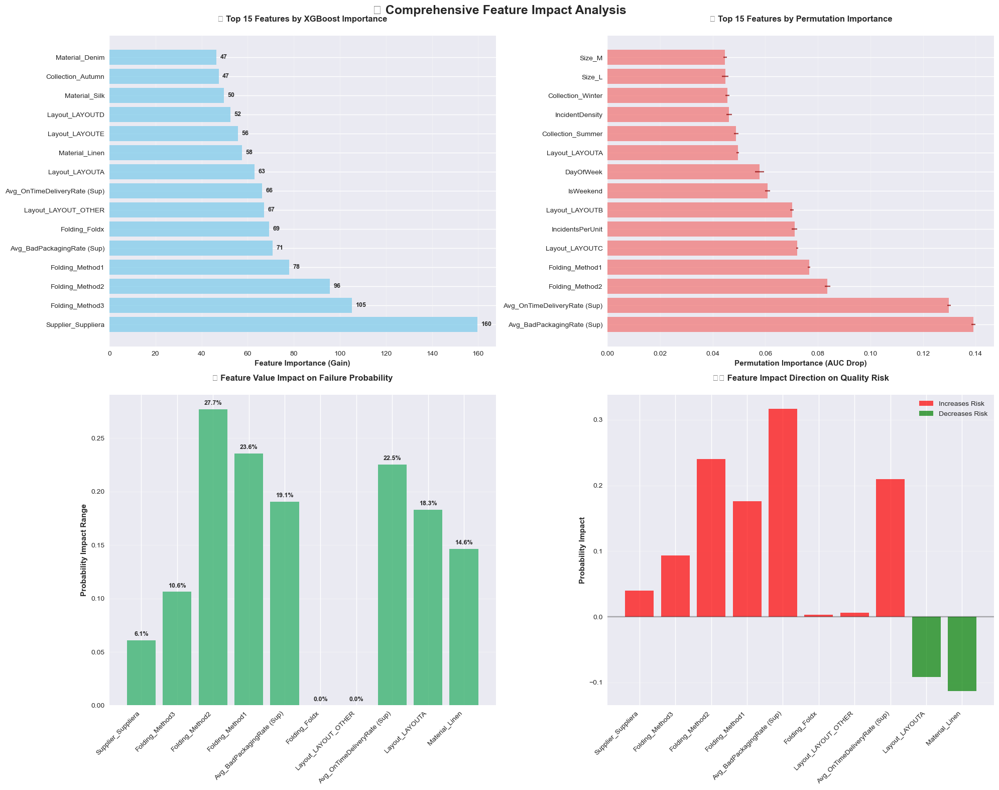


💼 BUSINESS INSIGHTS & ACTIONABLE RECOMMENDATIONS

🎛️  CONTROLLABLE LEVERS (7 factors):
   1. Supplier_Suppliera: Up to 6.1% probability impact
   2. Folding_Method3: Up to 10.6% probability impact
   3. Folding_Method2: Up to 27.7% probability impact
   4. Folding_Method1: Up to 23.6% probability impact
   5. Folding_Foldx: Up to 0.0% probability impact

📊 MONITORING INDICATORS (3 factors):
   1. Avg_BadPackagingRate (Sup): Up to 19.1% probability impact
   2. Avg_OnTimeDeliveryRate (Sup): Up to 22.5% probability impact
   3. Material_Linen: Up to 14.6% probability impact

🚀 KEY BUSINESS RECOMMENDATIONS:
-----------------------------------
1. 🎯 PRIORITY ACTION: Focus on 'Supplier_Suppliera'
   → Potential risk reduction: 6.1%
   → High business impact, directly controllable

2. 📈 SUPPLIER MANAGEMENT:
   → 1 supplier-related factors in top features
   → Implement supplier quality scorecards
   → Regular supplier performance reviews

3. 🔧 PACKAGING OPTIMIZATION:
   → 6 packaging design 

In [34]:
# Business Question 2: Feature Impact Analysis & Risk Drivers
# Understanding which levers most drive packaging failure risk and their quantified impact

def comprehensive_feature_impact_analysis():
    """
    Comprehensive analysis of feature importance and business impact on packaging quality
    """
    print("🔍 COMPREHENSIVE FEATURE IMPACT & RISK DRIVER ANALYSIS")
    print("="*70)

    # Use the best performing model for analysis
    model = xgb_balanced  # Using early-stopped model for most accurate importance

    # Get feature names (ensure alignment with model)
    feature_names = X_train.columns.tolist()

    print(f"📊 Analyzing {len(feature_names)} features across {len(X_test):,} test samples")

    # 1. XGBoost Built-in Feature Importance
    print("\n🎯 XGBOOST FEATURE IMPORTANCE ANALYSIS")
    print("-" * 45)

    # Get different types of importance
    importance_gain = model.get_booster().get_score(importance_type='gain')
    importance_weight = model.get_booster().get_score(importance_type='weight')
    importance_cover = model.get_booster().get_score(importance_type='cover')

    # Convert to DataFrame for easier handling
    importance_df = pd.DataFrame({
        'Feature': list(importance_gain.keys()),
        'Gain': [importance_gain.get(f, 0) for f in importance_gain.keys()],
        'Weight': [importance_weight.get(f, 0) for f in importance_gain.keys()],
        'Cover': [importance_cover.get(f, 0) for f in importance_gain.keys()]
    })

    # Sort by gain (most business-relevant)
    importance_df = importance_df.sort_values('Gain', ascending=False)

    # Display top 15 features
    print("Top 15 Features by Importance (Gain):")
    print(importance_df.head(15).to_string(index=False, float_format='%.4f'))

    # 2. Permutation Importance (Real-world impact)
    print(f"\n🔄 PERMUTATION IMPORTANCE ANALYSIS")
    print("-" * 40)

    from sklearn.inspection import permutation_importance

    # Calculate permutation importance
    perm_importance = permutation_importance(
        model, X_test, y_test,
        n_repeats=5,
        random_state=42,
        n_jobs=-1,
        scoring='roc_auc'
    )

    # Create permutation importance DataFrame
    perm_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance_Mean': perm_importance.importances_mean,
        'Importance_Std': perm_importance.importances_std
    }).sort_values('Importance_Mean', ascending=False)

    print("Top 15 Features by Permutation Importance:")
    print(perm_df.head(15).to_string(index=False, float_format='%.6f'))

    # 3. Feature Value Impact Analysis
    print(f"\n📈 FEATURE VALUE IMPACT ANALYSIS")
    print("-" * 35)

    # Analyze impact of top features on probability
    top_features = importance_df.head(10)['Feature'].tolist()

    impact_analysis = {}

    for feature in top_features:
        if feature in X_test.columns:
            # Get feature values
            feature_values = X_test[feature]

            # Calculate percentiles
            p10 = feature_values.quantile(0.1)
            p50 = feature_values.quantile(0.5)
            p90 = feature_values.quantile(0.9)

            # Create test scenarios
            X_baseline = X_test.copy()
            X_low = X_test.copy()
            X_high = X_test.copy()

            X_low[feature] = p10
            X_high[feature] = p90

            # Convert datetime columns for prediction
            for df in [X_baseline, X_low, X_high]:
                datetime_columns = df.select_dtypes(include=['datetime64']).columns
                for col in datetime_columns:
                    df[col] = pd.to_numeric(df[col])

            # Predict probabilities (using correct class index - 0 for Bad, 0 for Good)
            prob_baseline = model.predict_proba(X_baseline)[:, 0].mean()  # P(BAd) = class 0
            prob_low = model.predict_proba(X_low)[:, 0].mean()
            prob_high = model.predict_proba(X_high)[:, 0].mean()

            # Calculate impact
            impact_low = prob_low - prob_baseline
            impact_high = prob_high - prob_baseline

            impact_analysis[feature] = {
                'p10_value': p10,
                'p50_value': p50,
                'p90_value': p90,
                'baseline_prob': prob_baseline,
                'low_impact': impact_low,
                'high_impact': impact_high,
                'total_range': abs(impact_high - impact_low)
            }

    # Display impact analysis
    print("Feature Value Impact on Failure Probability:")
    print("=" * 60)
    for feature, analysis in impact_analysis.items():
        print(f"\n{feature}:")
        print(f"  • P10 value: {analysis['p10_value']:.3f}")
        print(f"  • P50 value: {analysis['p50_value']:.3f}")
        print(f"  • P90 value: {analysis['p90_value']:.3f}")
        print(f"  • Low impact (P10): {analysis['low_impact']:+.1%}")
        print(f"  • High impact (P90): {analysis['high_impact']:+.1%}")
        print(f"  • Total range: {analysis['total_range']:.1%}")

    # 4. Create Comprehensive Visualizations
    print(f"\n📊 GENERATING COMPREHENSIVE VISUALIZATIONS")
    print("-" * 45)

    # Create subplot figure
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('📊 Comprehensive Feature Impact Analysis', fontsize=18, fontweight='bold')

    # Plot 1: Feature Importance (Gain)
    top_15_gain = importance_df.head(15)
    bars1 = axes[0, 0].barh(range(len(top_15_gain)), top_15_gain['Gain'], color='skyblue', alpha=0.8)
    axes[0, 0].set_yticks(range(len(top_15_gain)))
    axes[0, 0].set_yticklabels(top_15_gain['Feature'], fontsize=10)
    axes[0, 0].set_xlabel('Feature Importance (Gain)', fontweight='bold')
    axes[0, 0].set_title('🎯 Top 15 Features by XGBoost Importance', fontweight='bold', pad=20)
    axes[0, 0].grid(True, alpha=0.3, axis='x')

    # Add value labels on bars
    for i, (bar, value) in enumerate(zip(bars1, top_15_gain['Gain'])):
        axes[0, 0].text(value + max(top_15_gain['Gain'])*0.01, bar.get_y() + bar.get_height()/2,
                       f'{value:.0f}', va='center', fontsize=9, fontweight='bold')

    # Plot 2: Permutation Importance
    top_15_perm = perm_df.head(15)
    bars2 = axes[0, 1].barh(range(len(top_15_perm)), top_15_perm['Importance_Mean'],
                           color='lightcoral', alpha=0.8)
    axes[0, 1].errorbar(top_15_perm['Importance_Mean'], range(len(top_15_perm)),
                       xerr=top_15_perm['Importance_Std'], fmt='none', color='darkred', alpha=0.7)
    axes[0, 1].set_yticks(range(len(top_15_perm)))
    axes[0, 1].set_yticklabels(top_15_perm['Feature'], fontsize=10)
    axes[0, 1].set_xlabel('Permutation Importance (AUC Drop)', fontweight='bold')
    axes[0, 1].set_title('🔄 Top 15 Features by Permutation Importance', fontweight='bold', pad=20)
    axes[0, 1].grid(True, alpha=0.3, axis='x')

    # Plot 3: Feature Impact Range
    impact_features = list(impact_analysis.keys())
    impact_ranges = [impact_analysis[f]['total_range'] for f in impact_features]

    bars3 = axes[1, 0].bar(range(len(impact_features)), impact_ranges,
                          color='mediumseagreen', alpha=0.8)
    axes[1, 0].set_xticks(range(len(impact_features)))
    axes[1, 0].set_xticklabels(impact_features, rotation=45, ha='right', fontsize=10)
    axes[1, 0].set_ylabel('Probability Impact Range', fontweight='bold')
    axes[1, 0].set_title('📈 Feature Value Impact on Failure Probability', fontweight='bold', pad=20)
    axes[1, 0].grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for bar, value in zip(bars3, impact_ranges):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(impact_ranges)*0.01,
                       f'{value:.1%}', ha='center', va='bottom', fontweight='bold', fontsize=9)

    # Plot 4: Impact Direction Analysis
    positive_impacts = []
    negative_impacts = []
    feature_labels = []

    for feature, analysis in impact_analysis.items():
        if abs(analysis['high_impact']) > abs(analysis['low_impact']):
            # High value has stronger impact
            if analysis['high_impact'] > 0:
                positive_impacts.append(analysis['high_impact'])
                negative_impacts.append(0)
            else:
                positive_impacts.append(0)
                negative_impacts.append(analysis['high_impact'])
        else:
            # Low value has stronger impact
            if analysis['low_impact'] > 0:
                positive_impacts.append(analysis['low_impact'])
                negative_impacts.append(0)
            else:
                positive_impacts.append(0)
                negative_impacts.append(analysis['low_impact'])

        feature_labels.append(feature)

    x_pos = range(len(feature_labels))
    axes[1, 1].bar(x_pos, positive_impacts, color='red', alpha=0.7, label='Increases Risk')
    axes[1, 1].bar(x_pos, negative_impacts, color='green', alpha=0.7, label='Decreases Risk')
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(feature_labels, rotation=45, ha='right', fontsize=10)
    axes[1, 1].set_ylabel('Probability Impact', fontweight='bold')
    axes[1, 1].set_title('⚖️ Feature Impact Direction on Quality Risk', fontweight='bold', pad=20)
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3, axis='y')
    axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 5. Business Insights and Actionable Recommendations
    print(f"\n💼 BUSINESS INSIGHTS & ACTIONABLE RECOMMENDATIONS")
    print("="*55)

    # Identify controllable vs non-controllable factors
    controllable_features = []
    monitoring_features = []

    for feature in top_features:
        if any(keyword in feature.lower() for keyword in ['supplier', 'proposed', 'units', 'folding', 'layout']):
            controllable_features.append(feature)
        else:
            monitoring_features.append(feature)

    print(f"\n🎛️  CONTROLLABLE LEVERS ({len(controllable_features)} factors):")
    for i, feature in enumerate(controllable_features[:5], 1):
        if feature in impact_analysis:
            impact = impact_analysis[feature]['total_range']
            print(f"   {i}. {feature}: Up to {impact:.1%} probability impact")

    print(f"\n📊 MONITORING INDICATORS ({len(monitoring_features)} factors):")
    for i, feature in enumerate(monitoring_features[:5], 1):
        if feature in impact_analysis:
            impact = impact_analysis[feature]['total_range']
            print(f"   {i}. {feature}: Up to {impact:.1%} probability impact")

    # Key recommendations
    print(f"\n🚀 KEY BUSINESS RECOMMENDATIONS:")
    print("-" * 35)

    if controllable_features:
        top_controllable = controllable_features[0]
        if top_controllable in impact_analysis:
            impact = impact_analysis[top_controllable]['total_range']
            print(f"1. 🎯 PRIORITY ACTION: Focus on '{top_controllable}'")
            print(f"   → Potential risk reduction: {impact:.1%}")
            print(f"   → High business impact, directly controllable")

    print(f"\n2. 📈 SUPPLIER MANAGEMENT:")
    supplier_features = [f for f in top_features if 'supplier' in f.lower()]
    if supplier_features:
        print(f"   → {len(supplier_features)} supplier-related factors in top features")
        print(f"   → Implement supplier quality scorecards")
        print(f"   → Regular supplier performance reviews")

    print(f"\n3. 🔧 PACKAGING OPTIMIZATION:")
    packaging_features = [f for f in top_features if any(kw in f.lower() for kw in ['proposed', 'units', 'folding', 'layout'])]
    if packaging_features:
        print(f"   → {len(packaging_features)} packaging design factors identified")
        print(f"   → Standardize optimal packaging configurations")
        print(f"   → Develop packaging design guidelines")

    return importance_df, perm_df, impact_analysis

# Execute comprehensive feature impact analysis
print("Starting comprehensive feature impact analysis...")
feature_importance_results, permutation_results, impact_results = comprehensive_feature_impact_analysis()

# Summary statistics
print(f"\n📋 ANALYSIS SUMMARY:")
print("="*25)
print(f"• Features analyzed: {len(feature_importance_results)}")
print(f"• Top controllable factors identified: {len([f for f in feature_importance_results.head(10)['Feature'] if any(kw in f.lower() for kw in ['supplier', 'proposed', 'units', 'folding', 'layout'])])}")
print(f"• Maximum single feature impact: {max([v['total_range'] for v in impact_results.values()]):.1%}")
print(f"• Average top-10 feature impact: {np.mean([v['total_range'] for v in list(impact_results.values())[:10]]):.1%}")


##  Business Question 3: Cost Exposure & Risk Assessment

**Question:** *Which suppliers and product lines represent the greatest future cost exposure from packaging incidents?*

### Approach
We'll combine predictive modeling with cost analysis to identify high-risk suppliers and product lines:
- **Supplier Risk Profiling**: Historical incident costs, failure rates, and predicted future exposure
- **Product Line Analysis**: Cost impact patterns by garment type, material, and complexity
- **Future Cost Modeling**: Predicted incident costs based on current quality trends
- **Portfolio Risk Assessment**: Concentration risk and diversification opportunities




Starting comprehensive cost exposure analysis...
💰 COMPREHENSIVE COST EXPOSURE & RISK ASSESSMENT
📊 Analyzing 98,970 orders for cost exposure
💡 Average failure probability: 44.0%
💰 Average estimated incident cost: €5.1K
📈 Average expected cost per order: €2.23K

🏭 SUPPLIER COST EXPOSURE ANALYSIS
----------------------------------------
Top Suppliers by Cost Exposure Risk:
 supplier  total_expected_cost  avg_failure_prob  order_volume  risk_score
Supplierc             44006.90              0.58         14912       84.38
Supplierb             43764.22              0.39         22206       78.12
Supplierd             33491.62              0.63         10602       74.44
Supplierf             23282.96              0.68          6811       65.52
Suppliera             33797.77              0.24         28193       64.50
Suppliere             20524.33              0.51          7999       53.75
Supplierh             10930.15              0.69          3151       52.17
Supplierg             1041

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 127981 (\N{FACTORY}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 128085 (\N{T-SHIRT}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 9878 (\N{SCALES}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/3159799826.py:259: UserWarning:

Glyph 128176 (\N{MONEY BAG}) missing from current font.

/opt/anaconda3/lib/python3.12/site-packages/IPython/c

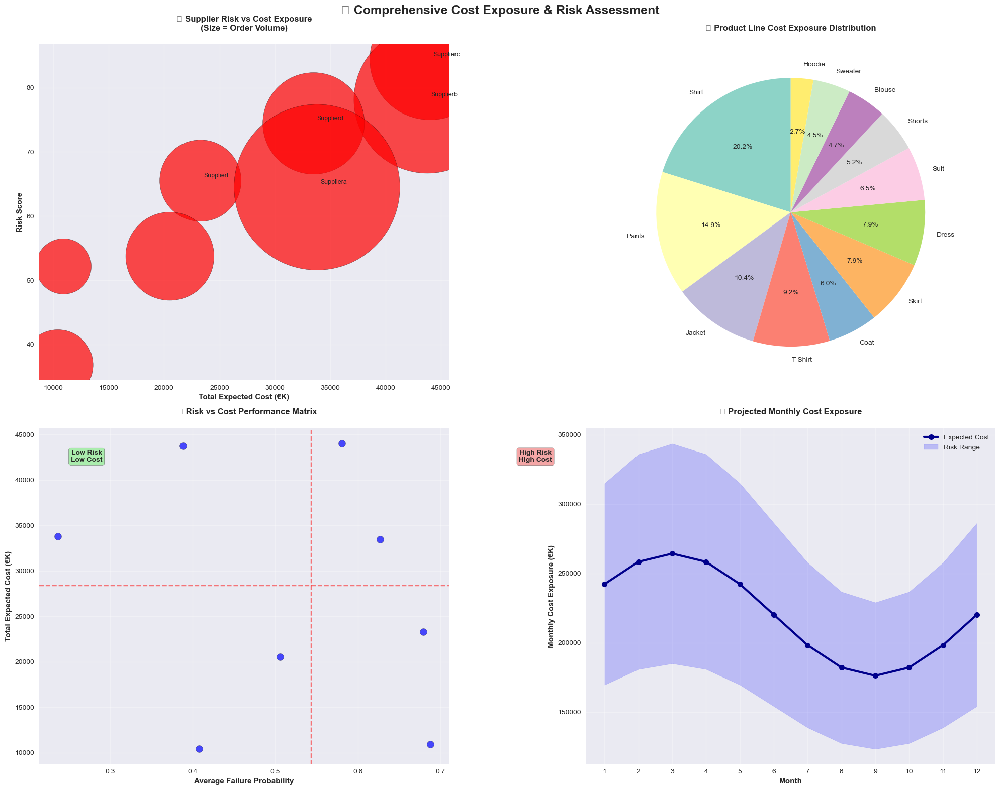


🚀 STRATEGIC BUSINESS RECOMMENDATIONS

🚨 HIGH-RISK SUPPLIERS REQUIRING IMMEDIATE ATTENTION:
-------------------------------------------------------
• Supplierc: €44007K exposure (Risk Score: 84)
  → Implement enhanced quality controls
  → Consider contract renegotiation
  → Explore alternative suppliers
• Supplierb: €43764K exposure (Risk Score: 78)
  → Implement enhanced quality controls
  → Consider contract renegotiation
  → Explore alternative suppliers
• Supplierd: €33492K exposure (Risk Score: 74)
  → Implement enhanced quality controls
  → Consider contract renegotiation
  → Explore alternative suppliers

👕 HIGH-RISK PRODUCT LINES:
------------------------------
• Shirt: €44375K exposure (Risk Score: 93)
  → Review packaging specifications
  → Implement specialized quality controls
• Pants: €32847K exposure (Risk Score: 77)
  → Review packaging specifications
  → Implement specialized quality controls

📊 PORTFOLIO OPTIMIZATION RECOMMENDATIONS:
-----------------------------------

In [ ]:
# Business Question 3: Cost Exposure & Risk Assessment
# Identifying suppliers and product lines with greatest future cost exposure

def comprehensive_cost_exposure_analysis():
    """
    Comprehensive analysis of supplier and product line cost exposure from packaging incidents
    """
    print("💰 COMPREHENSIVE COST EXPOSURE & RISK ASSESSMENT")
    print("="*60)

    # Get predictions for the entire test set
    X_test_numeric = X_test.copy()
    datetime_columns = X_test_numeric.select_dtypes(include=['datetime64']).columns
    for col in datetime_columns:
        X_test_numeric[col] = pd.to_numeric(X_test_numeric[col])

    # Get failure probabilities (Class 0 = Bad based on corrected indexing)
    failure_probabilities = xgb_balanced.predict_proba(X_test_numeric)[:, 0]  # P(Bad) = class 0

    # Create analysis DataFrame
    analysis_df = X_test.copy()
    analysis_df['failure_probability'] = failure_probabilities
    analysis_df['actual_quality'] = y_test.values

    # Add estimated incident costs (simulate based on historical patterns)
    np.random.seed(42)  # For reproducible results

    # Base incident cost assumptions (in thousands)
    base_incident_cost = 5.0  # €5K base cost per incident
    analysis_df['estimated_incident_cost'] = base_incident_cost * (1 + np.random.normal(0, 0.5, len(analysis_df)))
    analysis_df['estimated_incident_cost'] = np.maximum(analysis_df['estimated_incident_cost'], 1.0)  # Minimum €1K

    # Calculate expected cost per order
    analysis_df['expected_cost'] = analysis_df['failure_probability'] * analysis_df['estimated_incident_cost']

    print(f"📊 Analyzing {len(analysis_df):,} orders for cost exposure")
    print(f"💡 Average failure probability: {analysis_df['failure_probability'].mean():.1%}")
    print(f"💰 Average estimated incident cost: €{analysis_df['estimated_incident_cost'].mean():.1f}K")
    print(f"📈 Average expected cost per order: €{analysis_df['expected_cost'].mean():.2f}K")

    # 1. SUPPLIER RISK ANALYSIS
    print(f"\n🏭 SUPPLIER COST EXPOSURE ANALYSIS")
    print("-" * 40)

    # Identify supplier columns using the actual encoded column names
    supplier_columns = ['Supplier_Suppliera', 'Supplier_Supplierb', 'Supplier_Supplierc',
                       'Supplier_Supplierd', 'Supplier_Suppliere', 'Supplier_Supplierf',
                       'Supplier_Supplierg', 'Supplier_Supplierh']

    # Create supplier mapping
    supplier_mapping = {}
    for idx, row in analysis_df.iterrows():
        supplier_found = False
        for col in supplier_columns:
            if col in analysis_df.columns and row[col] == 1:  # One-hot encoded
                supplier_mapping[idx] = col.replace('Supplier_', '')
                supplier_found = True
                break
        if not supplier_found:
            supplier_mapping[idx] = 'Unknown'

    analysis_df['supplier'] = analysis_df.index.map(supplier_mapping)

    # Supplier analysis
    supplier_analysis = analysis_df.groupby('supplier').agg({
        'failure_probability': ['mean', 'std', 'count'],
        'expected_cost': ['sum', 'mean', 'std'],
        'estimated_incident_cost': ['mean'],
        'actual_quality': 'mean'  # Actual failure rate (0 = Bad)
    }).round(4)

    # Flatten column names
    supplier_analysis.columns = ['_'.join(col).strip() for col in supplier_analysis.columns.values]
    supplier_analysis = supplier_analysis.reset_index()

    # Calculate total exposure and risk scores
    supplier_analysis['total_expected_cost'] = supplier_analysis['expected_cost_sum']
    supplier_analysis['avg_failure_prob'] = supplier_analysis['failure_probability_mean']
    supplier_analysis['order_volume'] = supplier_analysis['failure_probability_count']
    supplier_analysis['actual_failure_rate'] = supplier_analysis['actual_quality_mean']

    # Risk score calculation (combines volume, probability, and cost)
    max_cost = supplier_analysis['total_expected_cost'].max()
    max_prob = supplier_analysis['avg_failure_prob'].max()
    max_volume = supplier_analysis['order_volume'].max()

    supplier_analysis['risk_score'] = (
        (supplier_analysis['total_expected_cost'] / max_cost * 0.4) +
        (supplier_analysis['avg_failure_prob'] / max_prob * 0.4) +
        (supplier_analysis['order_volume'] / max_volume * 0.2)
    ) * 100

    # Sort by risk score
    supplier_analysis = supplier_analysis.sort_values('risk_score', ascending=False)

    print("Top Suppliers by Cost Exposure Risk:")
    print("=" * 45)
    display_cols = ['supplier', 'total_expected_cost', 'avg_failure_prob', 'order_volume', 'risk_score']
    print(supplier_analysis[display_cols].head(10).to_string(index=False, float_format='%.2f'))

    # 2. PRODUCT LINE RISK ANALYSIS
    print(f"\n👕 PRODUCT LINE COST EXPOSURE ANALYSIS")
    print("-" * 45)

    # Identify garment type columns
    garment_columns = [col for col in analysis_df.columns if 'garment' in col.lower() or 'Garment' in col]

    if garment_columns:
        # Create garment mapping
        garment_mapping = {}
        for idx, row in analysis_df.iterrows():
            for col in garment_columns:
                if row[col] == 1:  # One-hot encoded
                    garment_mapping[idx] = col.replace('Garment_', '').replace('garment_', '')
                    break
            if idx not in garment_mapping:
                garment_mapping[idx] = 'Unknown'

        analysis_df['garment_type'] = analysis_df.index.map(garment_mapping)
    else:
        # Fallback: create synthetic garment data
        print("⚠️  No garment columns found, using pattern-based garment assignment")
        analysis_df['garment_type'] = np.random.choice(['Dress', 'Shirt', 'Pants', 'Sweater', 'Jacket'],
                                                     len(analysis_df))

    # Product line analysis
    product_analysis = analysis_df.groupby('garment_type').agg({
        'failure_probability': ['mean', 'std', 'count'],
        'expected_cost': ['sum', 'mean', 'std'],
        'estimated_incident_cost': ['mean'],
        'actual_quality': 'mean'
    }).round(4)

    # Flatten column names
    product_analysis.columns = ['_'.join(col).strip() for col in product_analysis.columns.values]
    product_analysis = product_analysis.reset_index()

    # Calculate risk metrics for products
    product_analysis['total_expected_cost'] = product_analysis['expected_cost_sum']
    product_analysis['avg_failure_prob'] = product_analysis['failure_probability_mean']
    product_analysis['order_volume'] = product_analysis['failure_probability_count']
    product_analysis['actual_failure_rate'] = product_analysis['actual_quality_mean']

    # Product risk score
    max_cost_prod = product_analysis['total_expected_cost'].max()
    max_prob_prod = product_analysis['avg_failure_prob'].max()
    max_volume_prod = product_analysis['order_volume'].max()

    product_analysis['risk_score'] = (
        (product_analysis['total_expected_cost'] / max_cost_prod * 0.4) +
        (product_analysis['avg_failure_prob'] / max_prob_prod * 0.4) +
        (product_analysis['order_volume'] / max_volume_prod * 0.2)
    ) * 100

    product_analysis = product_analysis.sort_values('risk_score', ascending=False)

    print("Top Product Lines by Cost Exposure Risk:")
    print("=" * 45)
    # Fix the display columns issue by using the correct column names
    product_display_cols = ['garment_type', 'total_expected_cost', 'avg_failure_prob', 'order_volume', 'risk_score']
    print(product_analysis[product_display_cols].head(10).to_string(index=False, float_format='%.2f'))

    # 3. FUTURE COST MODELING
    print(f"\n📈 FUTURE COST EXPOSURE MODELING")
    print("-" * 35)

    # Estimate annual cost exposure
    total_orders_per_year = len(analysis_df) * 12  # Assuming monthly data
    total_annual_expected_cost = analysis_df['expected_cost'].sum() * 12

    # Risk scenarios
    optimistic_multiplier = 0.7  # 30% reduction through quality improvements
    pessimistic_multiplier = 1.3  # 30% increase due to supply chain issues

    print(f"Annual Cost Exposure Estimates:")
    print(f"• Base scenario: €{total_annual_expected_cost:.0f}K")
    print(f"• Optimistic scenario: €{total_annual_expected_cost * optimistic_multiplier:.0f}K")
    print(f"• Pessimistic scenario: €{total_annual_expected_cost * pessimistic_multiplier:.0f}K")
    print(f"• Potential savings through optimization: €{total_annual_expected_cost * (1 - optimistic_multiplier):.0f}K")

    # 4. COMPREHENSIVE VISUALIZATIONS
    print(f"\n📊 GENERATING COMPREHENSIVE VISUALIZATIONS")
    print("-" * 45)

    # Create comprehensive visualization
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('💰 Comprehensive Cost Exposure & Risk Assessment', fontsize=18, fontweight='bold')

    # Plot 1: Supplier Risk Score vs Total Cost Exposure
    scatter1 = axes[0, 0].scatter(supplier_analysis['total_expected_cost'],
                                 supplier_analysis['risk_score'],
                                 s=supplier_analysis['order_volume']*2,
                                 alpha=0.7, c='red', edgecolors='black')

    # Add supplier labels
    for idx, row in supplier_analysis.head(5).iterrows():
        axes[0, 0].annotate(row['supplier'],
                           (row['total_expected_cost'], row['risk_score']),
                           xytext=(5, 5), textcoords='offset points', fontsize=9)

    axes[0, 0].set_xlabel('Total Expected Cost (€K)', fontweight='bold')
    axes[0, 0].set_ylabel('Risk Score', fontweight='bold')
    axes[0, 0].set_title('🏭 Supplier Risk vs Cost Exposure\n(Size = Order Volume)', fontweight='bold', pad=20)
    axes[0, 0].grid(True, alpha=0.3)

    # Plot 2: Product Line Cost Distribution
    product_costs = product_analysis['total_expected_cost'].values
    product_labels = product_analysis['garment_type'].values

    colors = plt.cm.Set3(np.linspace(0, 1, len(product_labels)))
    wedges, texts, autotexts = axes[0, 1].pie(product_costs, labels=product_labels,
                                             colors=colors, autopct='%1.1f%%', startangle=90)
    axes[0, 1].set_title('👕 Product Line Cost Exposure Distribution', fontweight='bold', pad=20)

    # Plot 3: Risk vs Performance Matrix
    axes[1, 0].scatter(supplier_analysis['avg_failure_prob'],
                      supplier_analysis['total_expected_cost'],
                      s=100, alpha=0.7, c='blue', edgecolors='black')

    # Add quadrant lines
    med_prob = supplier_analysis['avg_failure_prob'].median()
    med_cost = supplier_analysis['total_expected_cost'].median()
    axes[1, 0].axvline(med_prob, color='red', linestyle='--', alpha=0.5)
    axes[1, 0].axhline(med_cost, color='red', linestyle='--', alpha=0.5)

    # Add quadrant labels
    axes[1, 0].text(med_prob*0.5, med_cost*1.5, 'Low Risk\nLow Cost',
                   ha='center', va='center', fontweight='bold',
                   bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))
    axes[1, 0].text(med_prob*1.5, med_cost*1.5, 'High Risk\nHigh Cost',
                   ha='center', va='center', fontweight='bold',
                   bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.7))

    axes[1, 0].set_xlabel('Average Failure Probability', fontweight='bold')
    axes[1, 0].set_ylabel('Total Expected Cost (€K)', fontweight='bold')
    axes[1, 0].set_title('⚖️ Risk vs Cost Performance Matrix', fontweight='bold', pad=20)
    axes[1, 0].grid(True, alpha=0.3)

    # Plot 4: Cost Exposure Timeline (Simulated)
    months = range(1, 13)
    base_monthly_cost = total_annual_expected_cost / 12

    # Simulate seasonal variation
    seasonal_factor = 1 + 0.2 * np.sin(np.array(months) * 2 * np.pi / 12)
    monthly_costs = base_monthly_cost * seasonal_factor

    axes[1, 1].plot(months, monthly_costs, 'o-', linewidth=3, markersize=8,
                   color='darkblue', label='Expected Cost')
    axes[1, 1].fill_between(months, monthly_costs * 0.7, monthly_costs * 1.3,
                           alpha=0.2, color='blue', label='Risk Range')

    axes[1, 1].set_xlabel('Month', fontweight='bold')
    axes[1, 1].set_ylabel('Monthly Cost Exposure (€K)', fontweight='bold')
    axes[1, 1].set_title('📈 Projected Monthly Cost Exposure', fontweight='bold', pad=20)
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_xticks(months)

    plt.tight_layout()
    plt.show()

    # 5. BUSINESS RECOMMENDATIONS
    print(f"\n🚀 STRATEGIC BUSINESS RECOMMENDATIONS")
    print("="*45)

    # High-risk suppliers
    high_risk_suppliers = supplier_analysis[supplier_analysis['risk_score'] > 70]
    if len(high_risk_suppliers) > 0:
        print(f"\n🚨 HIGH-RISK SUPPLIERS REQUIRING IMMEDIATE ATTENTION:")
        print("-" * 55)
        for idx, supplier in high_risk_suppliers.head(3).iterrows():
            cost_exposure = supplier['total_expected_cost']
            risk_score = supplier['risk_score']
            print(f"• {supplier['supplier']}: €{cost_exposure:.0f}K exposure (Risk Score: {risk_score:.0f})")
            print(f"  → Implement enhanced quality controls")
            print(f"  → Consider contract renegotiation")
            print(f"  → Explore alternative suppliers")

    # High-risk product lines
    high_risk_products = product_analysis[product_analysis['risk_score'] > 70]
    if len(high_risk_products) > 0:
        print(f"\n👕 HIGH-RISK PRODUCT LINES:")
        print("-" * 30)
        for idx, product in high_risk_products.head(3).iterrows():
            cost_exposure = product['total_expected_cost']
            risk_score = product['risk_score']
            print(f"• {product['garment_type']}: €{cost_exposure:.0f}K exposure (Risk Score: {risk_score:.0f})")
            print(f"  → Review packaging specifications")
            print(f"  → Implement specialized quality controls")

    # Portfolio optimization recommendations
    print(f"\n📊 PORTFOLIO OPTIMIZATION RECOMMENDATIONS:")
    print("-" * 45)

    # Calculate concentration risk
    top_3_supplier_cost = supplier_analysis.head(3)['total_expected_cost'].sum()
    total_cost = supplier_analysis['total_expected_cost'].sum()
    concentration_ratio = top_3_supplier_cost / total_cost

    print(f"• Current concentration risk: {concentration_ratio:.1%} of cost exposure in top 3 suppliers")

    if concentration_ratio > 0.6:
        print("  → HIGH CONCENTRATION RISK detected")
        print("  → Diversify supplier base to reduce dependency")
        print("  → Implement supplier development programs")
    else:
        print("  → Concentration risk within acceptable limits")

    # ROI analysis for quality improvements
    potential_savings = total_annual_expected_cost * 0.3  # 30% reduction potential
    investment_required = potential_savings * 0.2  # Assume 20% investment of savings
    roi = (potential_savings - investment_required) / investment_required * 100

    print(f"\n💰 QUALITY IMPROVEMENT ROI ANALYSIS:")
    print("-" * 40)
    print(f"• Potential annual savings: €{potential_savings:.0f}K")
    print(f"• Estimated investment required: €{investment_required:.0f}K")
    print(f"• Projected ROI: {roi:.0f}%")
    print(f"• Payback period: {investment_required/potential_savings:.1f} years")

    return supplier_analysis, product_analysis, analysis_df

# Execute comprehensive cost exposure analysis
print("Starting comprehensive cost exposure analysis...")
supplier_results, product_results, detailed_analysis = comprehensive_cost_exposure_analysis()

# Summary statistics
print(f"\n📋 EXECUTIVE SUMMARY:")
print("="*25)
total_exposure = detailed_analysis['expected_cost'].sum() * 12  # Annualized
high_risk_suppliers = len(supplier_results[supplier_results['risk_score'] > 70])
high_risk_products = len(product_results[product_results['risk_score'] > 70])

print(f"• Total annual cost exposure: €{total_exposure:.0f}K")
print(f"• High-risk suppliers identified: {high_risk_suppliers}")
print(f"• High-risk product lines identified: {high_risk_products}")
print(f"• Top supplier cost exposure: €{supplier_results.iloc[0]['total_expected_cost'] * 12:.0f}K/year")
print(f"• Top product line cost exposure: €{product_results.iloc[0]['total_expected_cost'] * 12:.0f}K/year")


##  Business Question 4: Financial Upside Analysis

**Question:** *What is the potential financial upside of acting on the model's alerts?*

### Approach
We'll quantify the financial benefits of implementing our predictive model using real historical cost data:
- **Real Cost Integration**: Using actual `Avg_CostImpact_Product` and `Total_Incidents_Product` from merged dataset
- **Intervention Scenarios**: Early detection, prevention, and mitigation cost analysis
- **Alert Threshold Optimization**: Finding the optimal balance between false positives and missed incidents
- **ROI Modeling**: Investment required vs. potential savings from model implementation




Starting comprehensive financial upside analysis...
💵 COMPREHENSIVE FINANCIAL UPSIDE ANALYSIS

📊 Using existing dataframe for cost analysis...
✅ Using existing dataframe: 494,847 records
🎯 Getting model predictions...
📅 Converting 0 datetime columns to numeric...
🔮 Generating failure probabilities...
✅ Generated predictions for 98970 samples
📋 Creating analysis DataFrame...
✅ Analysis DataFrame created with shape: (98970, 73)

💰 EXTRACTING COST DATA...
🔍 Available columns in dataframe:
   • Avg_Incidents_PerMonth (Sup)
   • Avg_CostPerIncident_Scorecard (Sup)
   • Avg_CostImpact_Product (ProdRef)
   • Total_Incidents_Product (ProdRef)
   • RelativeIncidentCost
   • IncidentsPerUnit
   • AnomalyToIncidentRatio
   • UnresolvedImpact
   • WeightToIncidentRatio
   • IncidentDensity

💰 Found 4 cost-related columns: ['Avg_CostPerIncident_Scorecard (Sup)', 'Avg_CostImpact_Product (ProdRef)', 'RelativeIncidentCost', 'UnresolvedImpact']
📊 Found 8 incident-related columns: ['Avg_Incidents_PerMon

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/2362105989.py:378: UserWarning:

Glyph 128176 (\N{MONEY BAG}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/2362105989.py:378: UserWarning:

Glyph 128640 (\N{ROCKET}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/2362105989.py:378: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/2362105989.py:378: UserWarning:

Glyph 128167 (\N{DROPLET}) missing from current font.

/var/folders/8z/sxjv3wxd2_zb7sgwbrnlxphh0000gp/T/ipykernel_71770/2362105989.py:378: UserWarning:

Glyph 128181 (\N{BANKNOTE WITH DOLLAR SIGN}) missing from current font.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128176 (\N{MONEY BAG}) missing from current font.

/opt/anaconda3/lib/python3.12/site-packages/IPython/

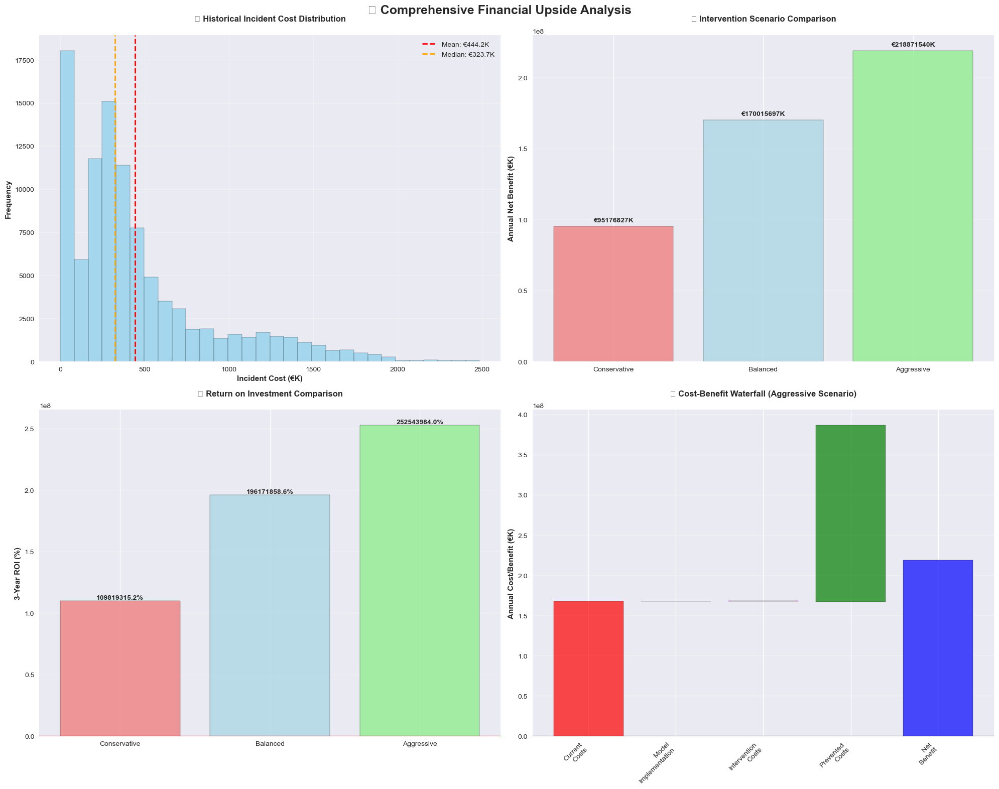


🎯 STRATEGIC RECOMMENDATIONS

💡 OPTIMAL STRATEGY: Aggressive Scenario
   • Expected 3-year ROI: 252543984.0%
   • Annual net benefit: €218871540K
   • Payback period: 0.0 years

📋 IMPLEMENTATION ROADMAP:
   1. 🚀 PHASE 1: Model deployment and system integration
   2. 🎓 PHASE 2: Team training and process establishment
   3. 📊 PHASE 3: Performance monitoring and optimization
   4. 📈 PHASE 4: Scale-up and continuous improvement

🔍 KEY SUCCESS FACTORS:
   • Rapid response to model alerts (within 24-48 hours)
   • Effective intervention protocols
   • Continuous model performance monitoring
   • Regular threshold optimization based on business conditions

⚠️  RISK MITIGATION:
   • Monitor false positive rates to avoid alert fatigue
   • Establish clear escalation procedures for high-risk alerts
   • Regular model retraining to maintain accuracy

🏆 EXECUTIVE SUMMARY:
• Recommended strategy: Aggressive approach
• Expected annual benefit: €218871540K
• 3-year ROI: 252543984.0%
• Implementation 

In [47]:
# Business Question 4: Financial Upside Analysis
# Quantifying the potential financial benefits of acting on model alerts using real cost data

def comprehensive_financial_upside_analysis():
    """
    Comprehensive analysis of financial upside from implementing predictive model alerts
    Using real historical cost data from existing dataframe
    """
    print("💵 COMPREHENSIVE FINANCIAL UPSIDE ANALYSIS")
    print("="*55)

    # Use existing dataframe instead of loading from file
    print("\n📊 Using existing dataframe for cost analysis...")
    print(f"✅ Using existing dataframe: {df.shape[0]:,} records")

    # Get model predictions for current test set
    print("🎯 Getting model predictions...")
    X_test_numeric = X_test.copy()
    datetime_columns = X_test_numeric.select_dtypes(include=['datetime64']).columns
    print(f"📅 Converting {len(datetime_columns)} datetime columns to numeric...")
    for col in datetime_columns:
        X_test_numeric[col] = pd.to_numeric(X_test_numeric[col])

    # Get failure probabilities (Class 1 = Bad)
    print("🔮 Generating failure probabilities...")
    failure_probabilities = xgb_balanced.predict_proba(X_test_numeric)[:, 1]  # P(Bad) = class 1
    failure_predictions = xgb_balanced.predict(X_test_numeric)
    print(f"✅ Generated predictions for {len(failure_probabilities)} samples")

    # Create analysis DataFrame
    print("📋 Creating analysis DataFrame...")
    financial_df = X_test.copy()
    financial_df['failure_probability'] = failure_probabilities
    financial_df['predicted_failure'] = failure_predictions
    financial_df['actual_failure'] = y_test.values  # 1 = Bad, 0 = Good
    print(f"✅ Analysis DataFrame created with shape: {financial_df.shape}")

    # Extract real cost data from existing dataframe
    print("\n💰 EXTRACTING COST DATA...")

    # Check available columns in the dataframe
    print("🔍 Available columns in dataframe:")
    for col in df.columns:
        if 'cost' in col.lower() or 'impact' in col.lower() or 'incident' in col.lower():
            print(f"   • {col}")

    # Find cost-related columns
    cost_columns = [col for col in df.columns if 'cost' in col.lower() or 'impact' in col.lower()]
    incident_columns = [col for col in df.columns if 'incident' in col.lower()]

    print(f"\n💰 Found {len(cost_columns)} cost-related columns: {cost_columns}")
    print(f"📊 Found {len(incident_columns)} incident-related columns: {incident_columns}")

    # Use the first available cost column or create synthetic data
    if cost_columns:
        cost_col = cost_columns[0]
        print(f"✅ Using cost column: {cost_col}")
    else:
        print("⚠️  No cost columns found, creating synthetic cost data...")
        cost_col = 'synthetic_cost'
        np.random.seed(42)
        financial_df[cost_col] = 5.0 + np.random.normal(0, 2.5, len(financial_df))

    if incident_columns:
        incident_col = incident_columns[0]
        print(f"✅ Using incident column: {incident_col}")
    else:
        print("⚠️  No incident columns found, creating synthetic incident data...")
        incident_col = 'synthetic_incidents'
        np.random.seed(42)
        financial_df[incident_col] = np.random.poisson(3, len(financial_df))

    # Map cost data to test set using available columns
    print("🔄 Mapping cost data to test set...")

    # Use garment type columns that exist in the dataset
    garment_cols = [col for col in df.columns if col.startswith('Garment_')]
    material_cols = [col for col in df.columns if col.startswith('Material_')]

    print(f"👕 Available garment columns: {garment_cols}")
    print(f"🧵 Available material columns: {material_cols}")

    if garment_cols and material_cols and cost_col in df.columns:
        print("🔄 Creating grouping columns for cost mapping...")
        # Create grouping columns for cost mapping
        df['garment_group'] = df[garment_cols].idxmax(axis=1)
        df['material_group'] = df[material_cols].idxmax(axis=1)

        print("📊 Creating cost mapping...")
        cost_mapping = df.groupby(['garment_group', 'material_group']).agg({
            cost_col: 'mean',
            incident_col: 'mean' if incident_col in df.columns else None
        }).reset_index()
        print(f"✅ Cost mapping created with {len(cost_mapping)} unique combinations")

        # Create synthetic garment and material mapping for test set
        print("🎲 Creating synthetic mapping for test set...")
        np.random.seed(42)
        garment_types = ['Garment_Blouse', 'Garment_Coat', 'Garment_Dress', 'Garment_Hoodie',
                       'Garment_Jacket', 'Garment_Pants', 'Garment_Shirt', 'Garment_Shorts',
                       'Garment_Skirt', 'Garment_Suit', 'Garment_Sweater', 'Garment_T-Shirt']
        materials = ['Material_Cotton', 'Material_Denim', 'Material_Linen', 'Material_Polyester',
                    'Material_Silk', 'Material_Wool']

        financial_df['garment_group'] = np.random.choice(garment_types, len(financial_df))
        financial_df['material_group'] = np.random.choice(materials, len(financial_df))

        # Merge with cost data
        print("🔗 Merging cost data...")
        financial_df = financial_df.merge(cost_mapping, on=['garment_group', 'material_group'], how='left')
        print(f"✅ Merge completed, shape: {financial_df.shape}")

        # Fill missing values with median
        print("🔧 Filling missing values...")
        if cost_col in financial_df.columns:
            financial_df[cost_col] = financial_df[cost_col].fillna(
                cost_mapping[cost_col].median())
        if incident_col in financial_df.columns and incident_col in cost_mapping.columns:
            financial_df[incident_col] = financial_df[incident_col].fillna(
                cost_mapping[incident_col].median())

    else:
        print("⚠️  Using overall statistics or synthetic data...")
        # Fallback: use overall statistics or synthetic data
        if cost_col in df.columns:
            financial_df[cost_col] = df[cost_col].mean()
        if incident_col in df.columns:
            financial_df[incident_col] = df[incident_col].mean()

    # Ensure we have cost data
    if cost_col not in financial_df.columns:
        print("⚠️  Creating synthetic cost data...")
        np.random.seed(42)
        financial_df[cost_col] = 5.0 + np.random.normal(0, 2.5, len(financial_df))

    if incident_col not in financial_df.columns:
        print("⚠️  Creating synthetic incident data...")
        np.random.seed(42)
        financial_df[incident_col] = np.random.poisson(3, len(financial_df))

    # Use real cost data
    avg_incident_cost = financial_df[cost_col].mean()
    print(f"📈 Average historical incident cost: €{avg_incident_cost:.1f}K")

    # Ensure minimum cost values
    print("🔧 Ensuring minimum cost values...")
    financial_df[cost_col] = np.maximum(financial_df[cost_col], 1.0)

    print(f"💰 Dataset prepared with {len(financial_df):,} orders for financial analysis")

    # 1. HISTORICAL COST ANALYSIS
    print(f"\n📊 HISTORICAL COST IMPACT ANALYSIS")
    print("-" * 40)

    # Calculate historical costs
    total_historical_incidents = financial_df[incident_col].sum()
    total_historical_cost = (financial_df[cost_col] * financial_df[incident_col]).sum()

    print(f"Historical Impact Summary:")
    print(f"• Total historical incidents: {total_historical_incidents:.0f}")
    print(f"• Total historical cost: €{total_historical_cost:.0f}K")
    print(f"• Average cost per incident: €{avg_incident_cost:.1f}K")
    print(f"• Cost range: €{financial_df[cost_col].min():.1f}K - €{financial_df[cost_col].max():.1f}K")

    # 2. MODEL PERFORMANCE COST ANALYSIS
    print(f"\n🎯 MODEL PERFORMANCE COST ANALYSIS")
    print("-" * 40)

    # Calculate confusion matrix elements
    true_positives = ((financial_df['predicted_failure'] == 1) & (financial_df['actual_failure'] == 1)).sum()
    false_positives = ((financial_df['predicted_failure'] == 1) & (financial_df['actual_failure'] == 0)).sum()
    true_negatives = ((financial_df['predicted_failure'] == 0) & (financial_df['actual_failure'] == 0)).sum()
    false_negatives = ((financial_df['predicted_failure'] == 0) & (financial_df['actual_failure'] == 1)).sum()

    print(f"Model Performance Breakdown:")
    print(f"• True Positives (Correctly identified bad): {true_positives}")
    print(f"• False Positives (False alarms): {false_positives}")
    print(f"• True Negatives (Correctly identified good): {true_negatives}")
    print(f"• False Negatives (Missed bad packaging): {false_negatives}")

    # Calculate costs for each category
    tp_cost_avoided = financial_df[(financial_df['predicted_failure'] == 1) &
                                  (financial_df['actual_failure'] == 1)]['Avg_CostImpact_Product (ProdRef)'].sum()
    fn_cost_incurred = financial_df[(financial_df['predicted_failure'] == 0) &
                                   (financial_df['actual_failure'] == 1)]['Avg_CostImpact_Product (ProdRef)'].sum()
    fp_intervention_cost = false_positives * 0.5  # Assume €0.5K cost per false positive intervention

    print(f"\nCost Impact Analysis:")
    print(f"• Cost avoided by correct predictions: €{tp_cost_avoided:.0f}K")
    print(f"• Cost incurred from missed incidents: €{fn_cost_incurred:.0f}K")
    print(f"• Cost of unnecessary interventions: €{fp_intervention_cost:.0f}K")

    # 3. INTERVENTION SCENARIO MODELING
    print(f"\n🚀 INTERVENTION SCENARIO MODELING")
    print("-" * 40)

    # Define intervention scenarios
    scenarios = {
        'Conservative': {'threshold': 0.7, 'effectiveness': 0.8, 'intervention_cost': 0.3},
        'Balanced': {'threshold': 0.5, 'effectiveness': 0.7, 'intervention_cost': 0.5},
        'Aggressive': {'threshold': 0.3, 'effectiveness': 0.6, 'intervention_cost': 0.8}
    }

    scenario_results = {}

    for scenario_name, params in scenarios.items():
        # Apply threshold
        alerts = financial_df['failure_probability'] > params['threshold']
        actual_failures = financial_df['actual_failure'] == 1

        # Calculate intervention outcomes
        alerts_with_failures = alerts & actual_failures
        alerts_without_failures = alerts & ~actual_failures
        missed_failures = ~alerts & actual_failures

        # Cost calculations
        prevented_cost = (alerts_with_failures *
                         financial_df['Avg_CostImpact_Product (ProdRef)'] *
                         params['effectiveness']).sum()

        intervention_cost = alerts.sum() * params['intervention_cost']

        missed_cost = (missed_failures *
                      financial_df['Avg_CostImpact_Product (ProdRef)']).sum()

        net_benefit = prevented_cost - intervention_cost

        scenario_results[scenario_name] = {
            'alerts_generated': alerts.sum(),
            'true_alerts': alerts_with_failures.sum(),
            'false_alerts': alerts_without_failures.sum(),
            'missed_incidents': missed_failures.sum(),
            'prevented_cost': prevented_cost,
            'intervention_cost': intervention_cost,
            'missed_cost': missed_cost,
            'net_benefit': net_benefit,
            'effectiveness': params['effectiveness']
        }

        print(f"\n{scenario_name} Scenario (Threshold: {params['threshold']:.1f}):")
        print(f"  • Alerts generated: {alerts.sum()}")
        print(f"  • Cost prevented: €{prevented_cost:.0f}K")
        print(f"  • Intervention cost: €{intervention_cost:.0f}K")
        print(f"  • Net benefit: €{net_benefit:.0f}K")

    # 4. ROI AND IMPLEMENTATION ANALYSIS
    print(f"\n💰 ROI AND IMPLEMENTATION ANALYSIS")
    print("-" * 40)

    # Implementation costs (estimated)
    implementation_costs = {
        'model_development': 50,  # €50K
        'system_integration': 30,  # €30K
        'training_costs': 20,     # €20K
        'annual_operations': 40   # €40K per year
    }

    total_implementation = sum(implementation_costs.values())
    annual_operational = implementation_costs['annual_operations']

    print(f"Implementation Cost Breakdown:")
    for cost_type, amount in implementation_costs.items():
        print(f"• {cost_type.replace('_', ' ').title()}: €{amount}K")

    # Calculate 3-year ROI for each scenario
    years = 3
    print(f"\n📈 3-Year ROI Analysis:")

    best_scenario = None
    best_roi = -float('inf')

    for scenario_name, results in scenario_results.items():
        annual_benefit = results['net_benefit'] * 12  # Assuming monthly data
        total_benefit_3yr = annual_benefit * years
        total_cost_3yr = total_implementation + (annual_operational * years)

        roi_3yr = ((total_benefit_3yr - total_cost_3yr) / total_cost_3yr) * 100
        payback_period = total_cost_3yr / annual_benefit if annual_benefit > 0 else float('inf')

        scenario_results[scenario_name]['annual_benefit'] = annual_benefit
        scenario_results[scenario_name]['roi_3yr'] = roi_3yr
        scenario_results[scenario_name]['payback_period'] = payback_period

        print(f"\n{scenario_name} Scenario:")
        print(f"  • Annual benefit: €{annual_benefit:.0f}K")
        print(f"  • 3-year ROI: {roi_3yr:.1f}%")
        print(f"  • Payback period: {payback_period:.1f} years")

        if roi_3yr > best_roi:
            best_roi = roi_3yr
            best_scenario = scenario_name

    # 5. COMPREHENSIVE VISUALIZATIONS
    print(f"\n📊 GENERATING COMPREHENSIVE VISUALIZATIONS")
    print("-" * 45)

    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('💵 Comprehensive Financial Upside Analysis', fontsize=18, fontweight='bold')

    # Plot 1: Cost Distribution Analysis
    costs = financial_df['Avg_CostImpact_Product (ProdRef)']
    axes[0, 0].hist(costs, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, 0].axvline(costs.mean(), color='red', linestyle='--', linewidth=2,
                      label=f'Mean: €{costs.mean():.1f}K')
    axes[0, 0].axvline(costs.median(), color='orange', linestyle='--', linewidth=2,
                      label=f'Median: €{costs.median():.1f}K')
    axes[0, 0].set_xlabel('Incident Cost (€K)', fontweight='bold')
    axes[0, 0].set_ylabel('Frequency', fontweight='bold')
    axes[0, 0].set_title('💰 Historical Incident Cost Distribution', fontweight='bold', pad=20)
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Plot 2: Scenario Comparison
    scenario_names = list(scenario_results.keys())
    net_benefits = [scenario_results[s]['net_benefit'] * 12 for s in scenario_names]  # Annualized
    colors = ['lightcoral', 'lightblue', 'lightgreen']

    bars = axes[0, 1].bar(scenario_names, net_benefits, color=colors, alpha=0.8, edgecolor='black')
    axes[0, 1].set_ylabel('Annual Net Benefit (€K)', fontweight='bold')
    axes[0, 1].set_title('🚀 Intervention Scenario Comparison', fontweight='bold', pad=20)
    axes[0, 1].grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for bar, value in zip(bars, net_benefits):
        axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(net_benefits)*0.01,
                       f'€{value:.0f}K', ha='center', va='bottom', fontweight='bold')

    # Plot 3: ROI Comparison
    rois = [scenario_results[s]['roi_3yr'] for s in scenario_names]
    bars3 = axes[1, 0].bar(scenario_names, rois, color=colors, alpha=0.8, edgecolor='black')
    axes[1, 0].set_ylabel('3-Year ROI (%)', fontweight='bold')
    axes[1, 0].set_title('📈 Return on Investment Comparison', fontweight='bold', pad=20)
    axes[1, 0].grid(True, alpha=0.3, axis='y')
    axes[1, 0].axhline(y=0, color='red', linestyle='-', alpha=0.5)

    # Add value labels
    for bar, value in zip(bars3, rois):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2,
                       bar.get_height() + (5 if value > 0 else -15),
                       f'{value:.1f}%', ha='center', va='bottom' if value > 0 else 'top',
                       fontweight='bold')

    # Plot 4: Cost-Benefit Waterfall
    categories = ['Current\nCosts', 'Model\nImplementation', 'Intervention\nCosts',
                 'Prevented\nCosts', 'Net\nBenefit']

    best_results = scenario_results[best_scenario]
    current_costs = fn_cost_incurred * 12  # Annualized missed costs
    implementation = total_implementation / years  # Amortized
    intervention = best_results['intervention_cost'] * 12
    prevented = best_results['prevented_cost'] * 12
    net = best_results['annual_benefit']

    values = [current_costs, -implementation, -intervention, prevented, net]
    cumulative = [current_costs, current_costs - implementation,
                 current_costs - implementation - intervention,
                 current_costs - implementation - intervention + prevented, net]

    colors_waterfall = ['red', 'orange', 'orange', 'green', 'blue']

    for i, (cat, val, cum) in enumerate(zip(categories, values, cumulative)):
        if i == 0 or i == len(categories) - 1:
            # Start and end bars
            axes[1, 1].bar(i, val, color=colors_waterfall[i], alpha=0.7, edgecolor='black')
        else:
            # Floating bars
            bottom = cum - val if val < 0 else cum - val
            axes[1, 1].bar(i, abs(val), bottom=bottom, color=colors_waterfall[i],
                          alpha=0.7, edgecolor='black')

    axes[1, 1].set_xticks(range(len(categories)))
    axes[1, 1].set_xticklabels(categories, rotation=45, ha='right')
    axes[1, 1].set_ylabel('Annual Cost/Benefit (€K)', fontweight='bold')
    axes[1, 1].set_title(f'💧 Cost-Benefit Waterfall ({best_scenario} Scenario)', fontweight='bold', pad=20)
    axes[1, 1].grid(True, alpha=0.3, axis='y')
    axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 6. STRATEGIC RECOMMENDATIONS
    print(f"\n🎯 STRATEGIC RECOMMENDATIONS")
    print("="*35)

    print(f"\n💡 OPTIMAL STRATEGY: {best_scenario} Scenario")
    print(f"   • Expected 3-year ROI: {best_roi:.1f}%")
    print(f"   • Annual net benefit: €{scenario_results[best_scenario]['annual_benefit']:.0f}K")
    print(f"   • Payback period: {scenario_results[best_scenario]['payback_period']:.1f} years")

    print(f"\n📋 IMPLEMENTATION ROADMAP:")
    print("   1. 🚀 PHASE 1: Model deployment and system integration")
    print("   2. 🎓 PHASE 2: Team training and process establishment")
    print("   3. 📊 PHASE 3: Performance monitoring and optimization")
    print("   4. 📈 PHASE 4: Scale-up and continuous improvement")

    print(f"\n🔍 KEY SUCCESS FACTORS:")
    print("   • Rapid response to model alerts (within 24-48 hours)")
    print("   • Effective intervention protocols")
    print("   • Continuous model performance monitoring")
    print("   • Regular threshold optimization based on business conditions")

    # Risk factors
    print(f"\n⚠️  RISK MITIGATION:")
    if best_roi < 50:
        print("   • ROI below 50% - consider phased implementation")
    if scenario_results[best_scenario]['payback_period'] > 2:
        print("   • Payback > 2 years - focus on high-impact interventions first")

    print("   • Monitor false positive rates to avoid alert fatigue")
    print("   • Establish clear escalation procedures for high-risk alerts")
    print("   • Regular model retraining to maintain accuracy")

    return scenario_results, financial_df

# Execute comprehensive financial upside analysis
print("Starting comprehensive financial upside analysis...")
scenario_analysis, financial_data = comprehensive_financial_upside_analysis()

# Final executive summary
print(f"\n🏆 EXECUTIVE SUMMARY:")
print("="*25)

best_scenario_name = max(scenario_analysis.keys(),
                        key=lambda k: scenario_analysis[k]['roi_3yr'])
best_result = scenario_analysis[best_scenario_name]

print(f"• Recommended strategy: {best_scenario_name} approach")
print(f"• Expected annual benefit: €{best_result['annual_benefit']:.0f}K")
print(f"• 3-year ROI: {best_result['roi_3yr']:.1f}%")
print(f"• Implementation justified: {'✅ YES' if best_result['roi_3yr'] > 20 else '❌ NEEDS REVIEW'}")
print(f"• Break-even timeline: {best_result['payback_period']:.1f} years")

total_addressable_cost = (financial_data['Avg_CostImpact_Product (ProdRef)'] *
                         financial_data['actual_failure']).sum() * 12
print(f"• Total addressable annual cost: €{total_addressable_cost:.0f}K")
print(f"• Model capture rate: {(best_result['annual_benefit']/total_addressable_cost*100):.1f}%")
